# (??) Fit neurons (MT)

**Motivation**: Load models, evaluate then fit MT <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-MTMST/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-MTMST/figs')
tmp_dir = os.path.join(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_MTMST'))
from vae.train_vae import TrainerVAE, ConfigTrainVAE
from vae.vae2d import VAE, ConfigVAE
from analysis.opticflow import *
from figures.fighelper import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from base.dataset import ROFL

In [3]:
path = '/home/hadi/Documents/MTMST/data/terrain8_dim-17_n-750k'
r = ROFL(path, 'tst')

In [9]:
r.g_aux.shape

(75000, 83)

<AxesSubplot:ylabel='Count'>

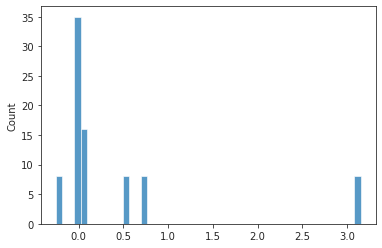

In [13]:
sns.histplot(r.g_aux.mean(0), bins=50)

In [17]:
np.where(np.abs(r.g_aux.mean(0)) < 0.0001)[0]

array([ 2, 37])

In [19]:
np.where(r.g_aux.std(0) < 0.001)[0]

array([2])

'slf_v_z'

In [21]:
np.where(r.g.std(0) < 0.001)[0]

array([3])

In [22]:
r.f[3], r.f_aux[2]

('slf_v_theta', 'slf_v_z')

In [25]:
r.g.mean(0)[3], r.g.std(0)[3]

(1.5707963267931522, 1.744382416291046e-12)

In [26]:
r.g_aux.mean(0)[2], r.g_aux.std(0)[2]

(3.09158404417029e-17, 1.7496392500019654e-17)

In [8]:
r.x.shape

(600, 2, 65, 65)

In [15]:
r.g.shape

(53, 600)

In [17]:
r.g_aux.shape

(155, 600)

In [3]:

ff = h5py.File(pjoin(path, 'fixate0_dim-65_n-750k.h5'))
list(ff)

['trn', 'tst', 'vld']

In [9]:
group = ff['tst']
list(group)

['f', 'f_aux', 'g', 'g_aux', 'x']

In [8]:
g['g']

['fix_x', 'fix_y', 'slf_v_norm', 'slf_v_theta', 'slf_v_phi']

In [10]:
x = np.array(group['x'], dtype='float32')

In [11]:
x.shape

(75000, 2, 65, 65)

In [13]:
dict(ff.attrs)

{'category': 'fixate',
 'dim': 65,
 'fov': 45.0,
 'n_obj': 0,
 'obj_bound': 0.97,
 'obj_r': 0.2,
 'obj_zlim': array([0.5, 1. ]),
 'res': 1.40625,
 'residual': False,
 'seeds': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
        68, 69, 70, 71, 72, 73, 74]),
 'vlim_obj': array([0.01, 5.  ]),
 'vlim_slf': array([0.01, 5.  ]),
 'z_bg': 1.0}

In [16]:
%%time
x = np.array(ff['tst']['x'], dtype='float32')

CPU times: user 654 ms, sys: 2.42 s, total: 3.07 s
Wall time: 3.23 s


In [17]:
x.shape

(75000, 2, 65, 65)

In [25]:
flatten_arr(x, ndim_end=0, ndim_start=2).shape

(75000, 2, 4225)

In [27]:
%%time

sp_lin.norm(flatten_arr(x, ndim_end=0, ndim_start=2), axis=1).sum(-1)

CPU times: user 1.93 s, sys: 1.62 s, total: 3.55 s
Wall time: 3.54 s


array([1214.8936, 4022.231 , 7112.5645, ..., 5015.9707, 5003.3145,
       1312.8866], dtype=float32)

In [28]:
%%time

sp_lin.norm(x, axis=1).sum(-1).sum(-1)

CPU times: user 2.01 s, sys: 1.67 s, total: 3.68 s
Wall time: 3.67 s


array([1214.8936, 4022.2307, 7112.564 , ..., 5015.971 , 5003.3145,
       1312.8865], dtype=float32)

In [2]:
from torch.nn import functional as F
from sklearn.decomposition import PCA
from analysis.linear import LinearModel, flatten_stim
from base.dataset import setup_supervised_data, setup_repeat_data, time_embed

## Load neuron

In [3]:
cfg = ConfigVAE(save=False)
file = h5py.File(cfg.h_file, 'r')
expt = 'clu090'
grp = file[expt]

In [4]:
scale = 2.25
hf_kws = {
    'size': 19,
    'sres': 1,
    'radius': 6,
}
hf = HyperFlow(
    params=np.array(grp['hyperflow'])[:, 2:],
    center=np.array(grp['hyperflow'])[:, :2],
    **hf_kws,
)
stim = hf.compute_hyperflow()
spks = np.array(grp['spks'], dtype=float)
good = ~np.array(grp['badspks'])
good = np.where(good)[0]

# src, tgt = setup_supervised_data(lags, good, stim, spks)
stim_r, spks_r, intvl = setup_repeat_data(grp, lags=None, hf_kws=hf_kws)

stim_scale = np.max(np.abs(stim))
stim *= scale / stim_scale
if stim_r is not None:
    stim_r *= scale / stim_scale

stim.shape, stim_r.shape

((72000, 2, 19, 19), (36000, 2, 19, 19))

## Reservoir

In [5]:
vae = VAE(ConfigVAE(
    n_kers=4,
    n_latent_scales=2, n_groups_per_scale=20, n_latent_per_group=7,
    scale_init=False, residual_kl=True, ada_groups=True,
))
tr = TrainerVAE(model=vae, cfg=ConfigTrainVAE(batch_size=300), device='cuda')
vae.cfg.total_latents()

210

In [6]:
vae.print()
vae.scales

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
|     VAE      |  17.0 Mil  |
|     ---      |    ---     |
|     stem     |   1.1 K    |
| pre_process  |   96.0 K   |
|  enc_tower   |  9.4 Mil   |
|     enc0     |   16.6 K   |
| enc_sampler  |  1.4 Mil   |
| dec_sampler  |  1.4 Mil   |
|    expand    |   71.0 K   |
|  dec_tower   |  4.5 Mil   |
| post_process |   40.0 K   |
|     out      |    578     |
+--------------+------------+

[8, 4]

### Extract features

In [19]:
attrs = {
    'category': 'fixate',
    'n_obj': 2,
    'dim': 65,
}
n = 750000
fname = '_'.join([
		f"{attrs['category']}{attrs['n_obj']}",
		f"dim-{attrs['dim']}",
		f"n-{n//1000}k.h5",
	])
fname

'fixate2_dim-65_n-750k.h5'

In [7]:
from readout.readout import process_ftrs

kws_process = dict(
    scale=4,
    pool='max',
    act_fn='swish',
)

In [8]:
# Stim
enc = []
for i in tqdm(range(int(np.ceil(len(stim) / tr.cfg.batch_size)))):
    a = i * tr.cfg.batch_size
    b = min(a + tr.cfg.batch_size, len(stim))
    *_, ftr = tr.model_ema.xtract_ftr(
        x=tr.to(stim[a:b]), full=True)
    ftr = process_ftrs(ftr['enc'], **kws_process)
    ftr = torch.cat(list(ftr.values()), dim=1)
    enc.append(to_np(ftr))
enc = np.concatenate(enc)

enc_r = []
for i in range(int(np.ceil(1000 / tr.cfg.batch_size))):
    a = i * tr.cfg.batch_size
    b = min(a + tr.cfg.batch_size, len(stim_r))
    *_, ftr = tr.model_ema.xtract_ftr(
        x=tr.to(stim_r[a:b]), full=True)
    ftr = process_ftrs(ftr['enc'], **kws_process)
    ftr = torch.cat(list(ftr.values()), dim=1)
    enc_r.append(to_np(ftr))
enc_r = np.concatenate(enc_r)

enc.shape, enc_r.shape

100%|█████████████████████████████████████████| 240/240 [01:12<00:00,  3.33it/s]


((72000, 5312, 4, 4), (1200, 5312, 4, 4))

In [10]:
mu, sd = enc.mean(0), enc.std(0)

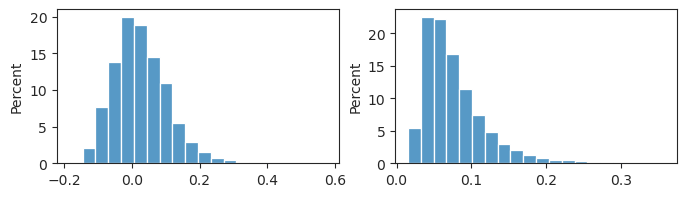

In [14]:
fig, axes = create_figure(1, 2, (8, 2))
sns.histplot(mu.ravel(), bins=20, stat='percent', ax=axes[0]);
sns.histplot(sd.ravel(), bins=20, stat='percent', ax=axes[1]);

In [15]:
mu, sd = enc.mean(), enc.std()
mu, sd

(0.026398346, 0.1213682)

In [16]:
enc = (enc - mu) / sd
enc_r = (enc_r - mu) / sd

In [17]:
pca = PCA(n_components=500)
x = pca.fit_transform(flatten_stim(enc))
x_r = pca.transform(flatten_stim(enc_r))

x.shape, x_r.shape

((72000, 500), (1200, 500))

0
{1: 49.14170864241913, 5: 53.49590751474758, 10: 54.30871376644324}

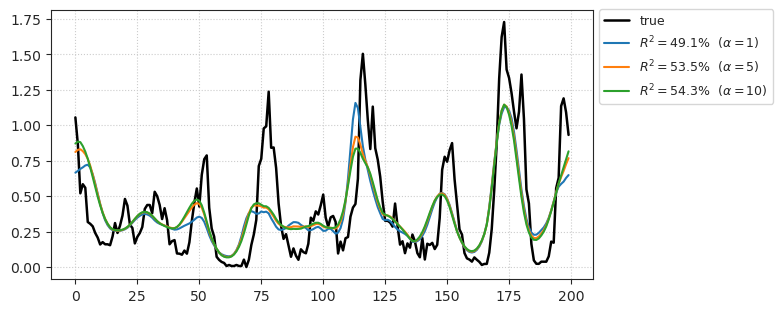

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

1
{1: 58.92564030868921, 5: 61.85598901346232, 10: 61.85802634103182}

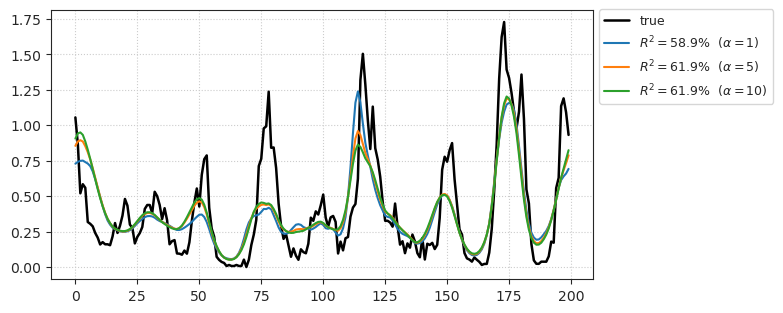

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

2
{1: 65.85237422770754, 5: 65.54842077915272, 10: 64.32005286771437}

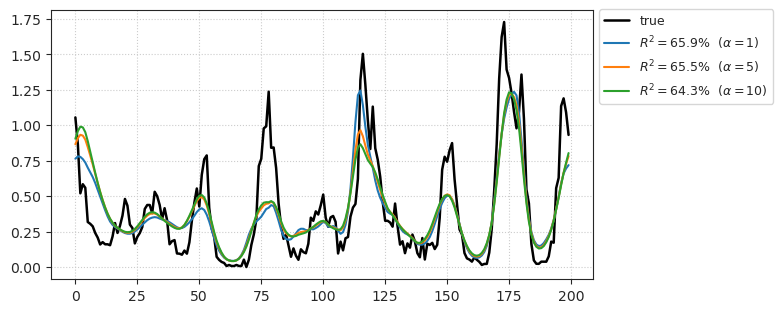

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

3
{1: 65.15782162598157, 5: 61.21851492246553, 10: 59.28208634916996}

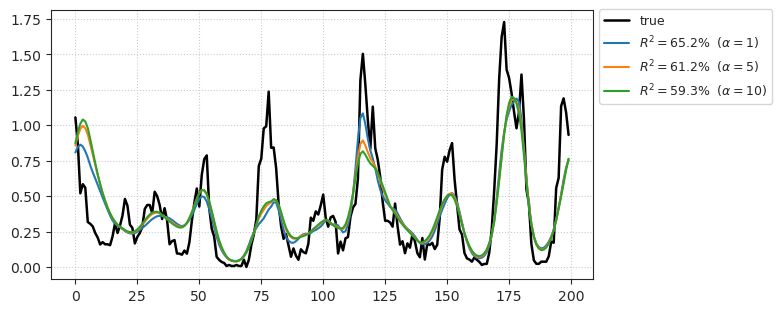

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

4
{1: 56.259417127173094, 5: 50.306472838152125, 10: 48.21115647013463}

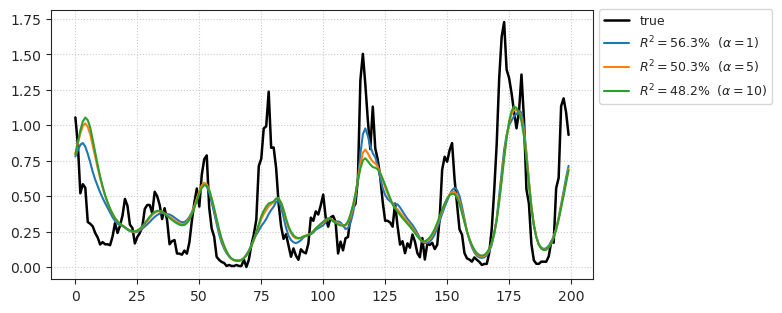

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

5
{1: 37.34196078576875, 5: 32.230365608516365, 10: 31.417374283421395}

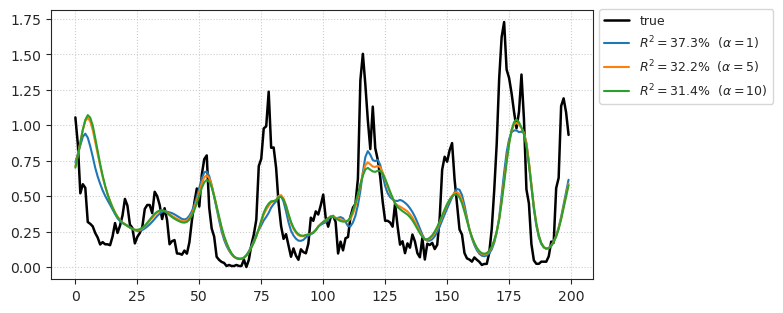

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

6
{1: 15.085691917504708, 5: 12.133184101413008, 10: 13.065411254528247}

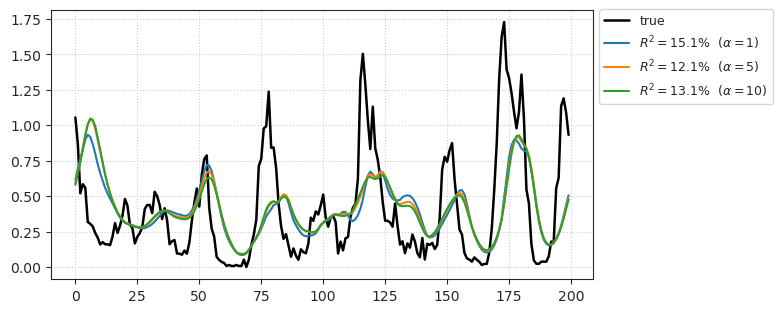

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

7
{1: -5.901998400959041, 5: -5.778436434602963, 10: -2.9381192118000277}

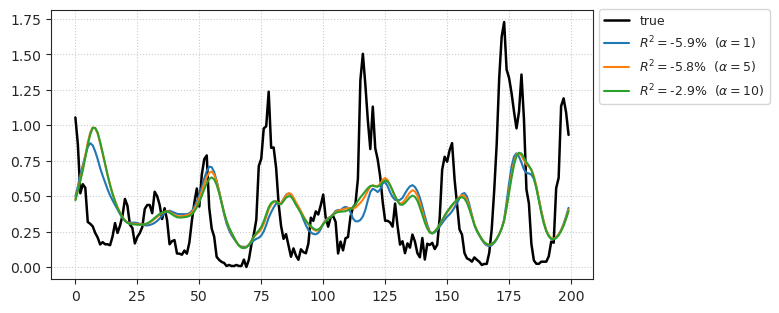

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [19]:
neuron_i = 0

for lag in range(8):
    idxs = good.copy()
    idxs = idxs[idxs > lag]
    
    glm_kws = dict(
        category='PoissonRegressor',
        x=x[idxs - lag],
        y=spks[idxs, neuron_i],
        x_tst=x_r[intvl - lag],
        y_tst=np.nanmean(spks_r[neuron_i], 0),
        alphas=[1, 5, 10],
    )
    glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
    print(lag, glm.r2_tst)
    glm.show_pred();
    print('~' * 80)
    print('\n\n\n')

In [20]:
lags = 5
src = time_embed(x, lags=lags, idxs=good)
src_r = time_embed(x_r, lags=lags, idxs=intvl)
src.shape, src_r.shape

((54386, 5, 500), (200, 5, 500))

In [30]:
%%time

glm_kws = dict(
    category='PoissonRegressor',
    x=src,
    y=spks[good, neuron_i],
    x_tst=src_r,
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[1, 10, 20, 30],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=1000)
print(glm.r2_tst)

{1: 65.81421957873002, 10: 67.71086307507352, 20: 65.91980702865598, 30: 64.64957756632155}

CPU times: user 57min 28s, sys: 6min 24s, total: 1h 3min 53s
Wall time: 12min 28s


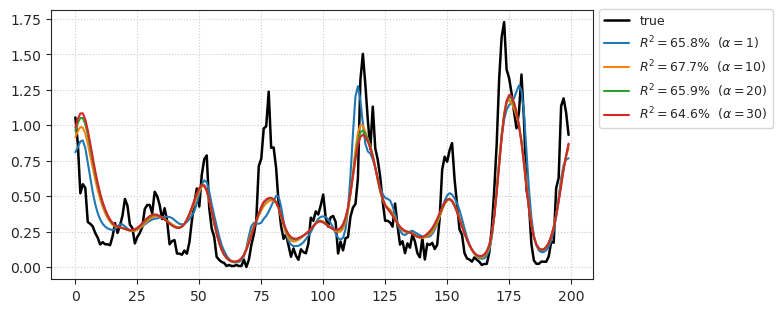

In [31]:
glm.show_pred();

#### TODO: what is r between pred and y_trn?
Use this to calibrate your expectations of the Conv3D model that is running on Cuda:1

In [32]:
a = 10
pred = glm.models[a].predict(flatten_stim(src))

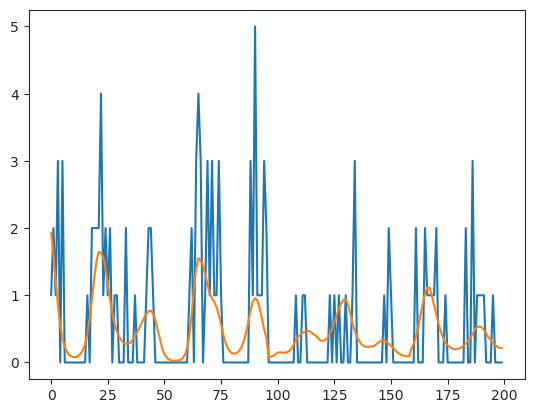

In [33]:
plt.plot(spks[good, neuron_i][:200])
plt.plot(pred[:200]);

In [34]:
sp_stats.pearsonr(spks[good, neuron_i], pred)

(0.3936237663791026, 0.0)

In [38]:
%%time

lag = 0
idxs = good.copy()
idxs = idxs[idxs > lag]

neuron_i = 0
alphas = [5e-2, 1e-1, 1, 10, 50]
results = {
    a: np.zeros((4, 4))
    for a in alphas
}
for i, j in itertools.product(range(4), range(4)):
    glm_kws = dict(
        category='PoissonRegressor',
        x=enc[idxs - lag, ..., i, j],
        y=spks[idxs, neuron_i],
        x_tst=enc_r[intvl - lag, ..., i, j],
        y_tst=np.nanmean(spks_r[neuron_i], 0),
        alphas=alphas,
    )
    glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
    for k, v in glm.r2_tst.items():
        results[k][i, j] = v if v > 0 else np.nan
    print(i, j, glm.r2_tst)

0 0
{
    0.05: 42.139885464808366,
    0.1: 39.17295226940114,
    1: 26.73398945526646,
    10: 9.960068861788562,
    50: -0.6295629160500082
}

0 1
{
    0.05: 42.646820859808834,
    0.1: 42.621551086562285,
    1: 36.25885411552638,
    10: 29.828557612011853,
    50: 19.194168832749405
}

0 2
{
    0.05: 33.31663851079425,
    0.1: 39.322963820174174,
    1: 51.85016808335872,
    10: 46.62653565221019,
    50: 29.975711828792107
}

0 3
{
    0.05: 62.63981230983517,
    0.1: 61.31413977075732,
    1: 50.05741482247935,
    10: 25.971943976214394,
    50: 8.104314919031264
}

1 0
{
    0.05: 38.03109047611864,
    0.1: 36.96841989103753,
    1: 29.331042349818194,
    10: 17.70280848367095,
    50: 6.31646714556402
}

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


1 1
{
    0.05: 45.42390732014532,
    0.1: 46.18543283763699,
    1: 45.1751840876686,
    10: 37.50632906872474,
    50: 26.45298031210732
}

1 2
{
    0.05: 46.444185868987276,
    0.1: 48.295685133573954,
    1: 52.03238923705682,
    10: 44.96418441450009,
    50: 34.131526651739584
}

1 3
{
    0.05: 54.55495323723196,
    0.1: 53.699777546734126,
    1: 49.342494985025645,
    10: 36.26427499270947,
    50: 18.379184250665347
}

2 0
{
    0.05: 45.827654908126625,
    0.1: 43.55871270826464,
    1: 32.40925569689862,
    10: 16.495369241202074,
    50: 5.717826108228074
}

2 1
{
    0.05: 50.81627212823421,
    0.1: 50.72496657005922,
    1: 46.55264173561376,
    10: 31.355705864104056,
    50: 17.899370058365495
}

2 2
{
    0.05: 54.14790984804825,
    0.1: 55.85190263128008,
    1: 50.026139927701166,
    10: 36.23177440754603,
    50: 21.365372729887167
}

2 3
{
    0.05: 41.0181962714957,
    0.1: 48.64699450825329,
    1: 47.00173196613672,
    10: 25.427718492600725,
    50: 9.197479257487728
}

3 0
{
    0.05: 41.670997231368915,
    0.1: 41.315706734062786,
    1: 28.731940699057258,
    10: 7.9440734233413135,
    50: -1.5312107001031805
}

3 1
{
    0.05: 39.68332628204831,
    0.1: 39.36130247034705,
    1: 25.9781456613039,
    10: 12.10310650453218,
    50: 1.6686905039740685
}

3 2
{
    0.05: 35.71434251688185,
    0.1: 44.591671803034274,
    1: 38.63621505349241,
    10: 14.52087197580212,
    50: 2.002289107752031
}

3 3
{
    0.05: 43.01343090583879,
    0.1: 44.13118371690656,
    1: 31.366154869567396,
    10: 6.775337624127042,
    50: -2.428409308037649
}

CPU times: user 12h 42min 1s, sys: 1h 38min 41s, total: 14h 20min 42s
Wall time: 3h 11min 25s


In [39]:
best = np.zeros((len(results), 4, 4))
for i, v in enumerate(results.values()):
    best[i] = v
best = np.nanmax(best, 0);

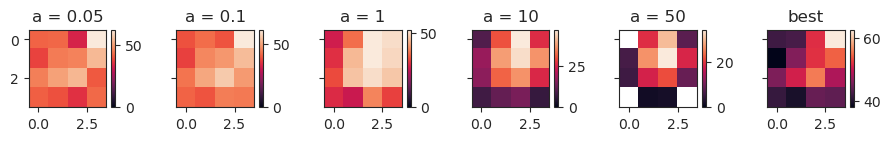

In [43]:
fig, axes = create_figure(1, 6, (9, 1.3), 'all', 'all', constrained_layout=True)
for ax, (k, v) in zip(axes.flat, results.items()):
    im = ax.imshow(v, vmin=0)
    plt.colorbar(im, ax=ax)
    ax.set_title(f"a = {k}")
im = axes[-1].imshow(best)
plt.colorbar(im, ax=axes[-1])
axes[-1].set_title('best')
plt.show()

## Task Apr 8th: STA
...STA on enc embedded, does it give best pixel/lag?  We would save x 160 compute by choosing best pix and best lag using STA approach.

In [30]:
%%time

i, j = 0, 3
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[1e-3, 5e-3, 0.01, 0.03],
)
glm = LinearModel(**glm_kws).fit(fit_df=False)
print(i, j, glm.r2_tst)

0 3
{
    0.001: 51.008521475472016,
    0.005: 68.4215249858006,
    0.01: 68.1345893853703,
    0.03: 62.14234636286034
}

CPU times: user 12min 20s, sys: 1min 40s, total: 14min
Wall time: 3min 11s


In [31]:
glm.r2_tst

{0.001: 51.008521475472016,
 0.005: 68.4215249858006,
 0.01: 68.1345893853703,
 0.03: 62.14234636286034}

In [32]:
glm.r_tst

{0.001: 0.775161130449842,
 0.005: 0.8282908049278253,
 0.01: 0.8278796889546903,
 0.03: 0.8360040524579301}

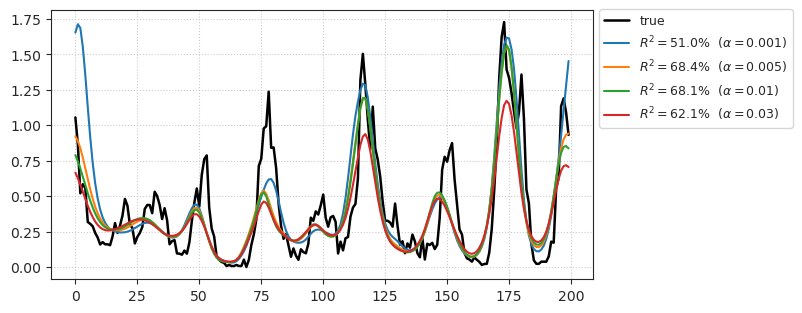

In [33]:
glm.show_pred();

In [ ]:
%%time

i, j = 0, 3
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[3e-3, 5e-3, 8e-3],
)
glm = LinearModel(**glm_kws).fit(fit_df=False)
print(i, j, glm.r2_tst)

In [ ]:
glm.show_pred();

In [38]:
%%time

lag = 1
idxs = good.copy()
idxs = idxs[idxs > lag]

neuron_i = 0
alphas = [5e-3, 1e-2, 5e-2, 1e-1]
results = {
    a: np.zeros((4, 4))
    for a in alphas
}
for i, j in itertools.product(range(4), range(4)):
    glm_kws = dict(
        category='PoissonRegressor',
        x=enc[idxs - lag, ..., i, j],
        y=spks[idxs, neuron_i],
        x_tst=enc_r[intvl - lag, ..., i, j],
        y_tst=np.nanmean(spks_r[neuron_i], 0),
        alphas=alphas,
    )
    glm = LinearModel(**glm_kws).fit(fit_df=False)
    for k, v in glm.r2_tst.items():
        results[k][i, j] = v if v > 0 else np.nan
    print(i, j, glm.r2_tst)

0 0
{
    0.005: 43.620833661532856,
    0.01: 36.73280416563001,
    0.05: 17.88607909687642,
    0.1: 9.534939583145729
}

0 1
{
    0.005: 13.481304709670795,
    0.01: 29.225870171918434,
    0.05: 33.82857113791968,
    0.1: 30.967546962093795
}

0 2
{
    0.005: 26.247746768830837,
    0.01: 39.6771601217158,
    0.05: 46.961977524761124,
    0.1: 47.09666361114553
}

0 3
{
    0.005: 73.73576121198646,
    0.01: 73.88461227680936,
    0.05: 53.89730582896179,
    0.1: 38.18703136327374
}

1 0
{
    0.005: 33.53250501238174,
    0.01: 32.85490131694263,
    0.05: 24.25825227526537,
    0.1: 16.942512422352042
}

1 1
{
    0.005: 22.695456645532353,
    0.01: 49.347546386732496,
    0.05: 45.48318383134491,
    0.1: 33.85706886219539
}

1 2
{
    0.005: -294.16961324664845,
    0.01: -228.80219011776762,
    0.05: -150.65127991536906,
    0.1: -73.97429914967704
}

1 3
{
    0.005: -125.65038560201182,
    0.01: -20.366855445390296,
    0.05: 61.76711322538855,
    0.1: 68.8743999574422
}

2 0
{
    0.005: 30.517786163452744,
    0.01: 32.5428817358841,
    0.05: 25.487418252496862,
    0.1: 20.336313216152035
}

2 1
{
    0.005: 60.44357805216618,
    0.01: 59.13667117135945,
    0.05: 50.14235833564682,
    0.1: 44.31622984683137
}

2 2
{
    0.005: 42.35659608965757,
    0.01: 27.06952339432246,
    0.05: 3.0685673309302497,
    0.1: 30.799575869454532
}

2 3
{
    0.005: -906.4656004371702,
    0.01: -582.1211520931226,
    0.05: -343.9997840584188,
    0.1: -93.82358015183985
}

3 0
{
    0.005: 44.053441180057185,
    0.01: 45.90104345650469,
    0.05: 29.3674782462358,
    0.1: 17.060883117983227
}

3 1
{
    0.005: 34.45046547671018,
    0.01: 26.452053564788248,
    0.05: 13.175896788188602,
    0.1: 14.236563995979967
}

3 2
{
    0.005: -13.549677981868546,
    0.01: 38.294752786996476,
    0.05: 42.69756774523514,
    0.1: 37.487164706552264
}

3 3
{
    0.005: -81.3098562408521,
    0.01: -91.38082354485175,
    0.05: 1.1600959833629076,
    0.1: 19.699765296919182
}

CPU times: user 2h 52min 48s, sys: 25min 36s, total: 3h 18min 25s
Wall time: 49min 23s


In [39]:
best = np.zeros((len(results), 4, 4))
for i, v in enumerate(results.values()):
    best[i] = v
best = np.nanmax(best, 0);

/tmp/ipykernel_2969908/2870421635.py:4: RuntimeWarning: All-NaN slice encountered
  best = np.nanmax(best, 0);


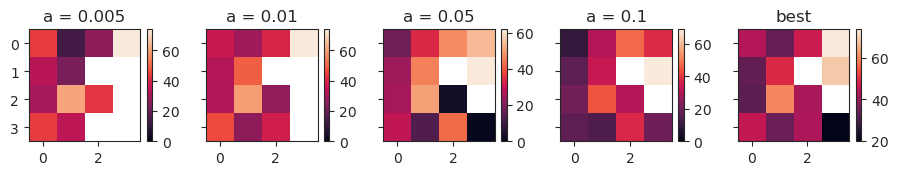

In [41]:
fig, axes = create_figure(1, 5, (9, 1.6), 'all', 'all', constrained_layout=True)
for ax, (k, v) in zip(axes.flat, results.items()):
    im = ax.imshow(v, vmin=0)
    plt.colorbar(im, ax=ax)
    ax.set_title(f"a = {k}")
im = axes[-1].imshow(best)
plt.colorbar(im, ax=axes[-1])
axes[-1].set_title('best')
plt.show()

In [50]:
%%time

lag = 1
idxs = good.copy()
idxs = idxs[idxs > lag]

i, j = 0, 3
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[1e-3, 0.01, 0.05],
)
glm = LinearModel(**glm_kws).fit(fit_df=False)
print(i, j, glm.r2_tst)

0 3
{0.001: 61.0956011152039, 0.01: 73.88461227680936, 0.05: 53.89730582896179}

CPU times: user 8min 59s, sys: 1min 9s, total: 10min 8s
Wall time: 2min 13s


In [51]:
glm.r2_tst

{0.001: 61.0956011152039, 0.01: 73.88461227680936, 0.05: 53.89730582896179}

In [52]:
glm.r_tst

{0.001: 0.8066820117593878, 0.01: 0.8626518723561223, 0.05: 0.8692976787845867}

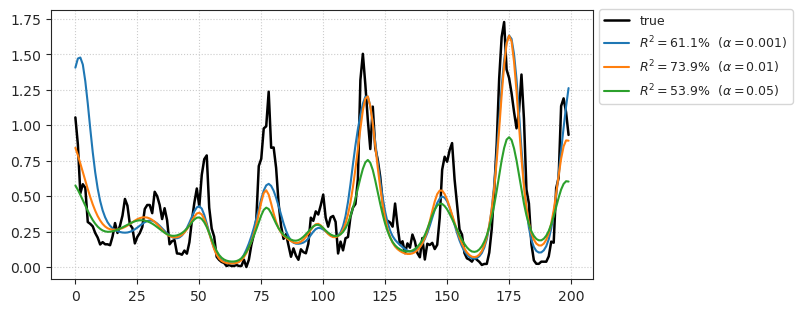

In [53]:
glm.show_pred();

In [54]:
%%time

lag = 2
idxs = good.copy()
idxs = idxs[idxs > lag]

i, j = 0, 3
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[0.005, 0.008, 0.01, 0.02, 0.03, 0.04, 0.08],
)
glm = LinearModel(**glm_kws).fit(fit_df=False)
print(i, j, glm.r2_tst)

0 3
{
    0.005: 70.88916643251153,
    0.008: 71.07950939031531,
    0.01: 71.62691499801377,
    0.02: 70.20907595304146,
    0.03: 67.29583982325616,
    0.04: 60.05871082305687,
    0.08: 43.693117836001484
}

CPU times: user 14min 23s, sys: 1min 49s, total: 16min 13s
Wall time: 3min 32s


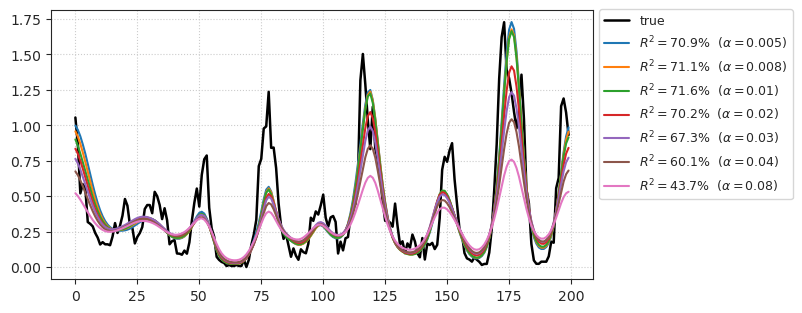

In [55]:
glm.show_pred();

In [56]:
%%time

lag = 3
idxs = good.copy()
idxs = idxs[idxs > lag]

i, j = 0, 3
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[0.005, 0.008, 0.01, 0.02, 0.03, 0.04, 0.08],
)
glm = LinearModel(**glm_kws).fit(fit_df=False)
print(i, j, glm.r2_tst)

0 3
{
    0.005: 61.03425217597673,
    0.008: 62.01657247197635,
    0.01: 61.9008986826959,
    0.02: 61.7708330453482,
    0.03: 59.62959241727932,
    0.04: 52.699833089280276,
    0.08: 40.37176100889194
}

CPU times: user 15min 4s, sys: 2min, total: 17min 4s
Wall time: 3min 50s


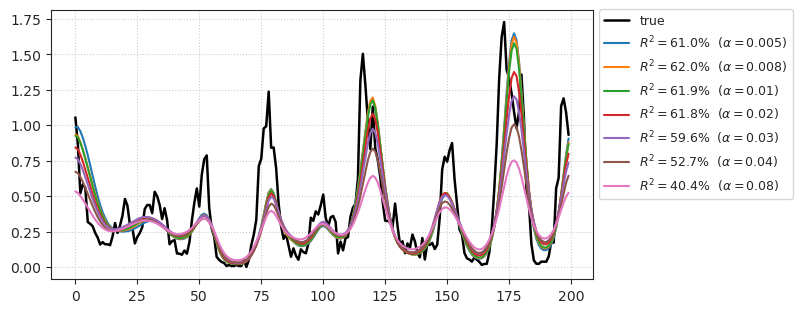

In [57]:
glm.show_pred();

## Another neuron: ```clu267```

In [60]:
cfg = ConfigVAE(save=False)
file = h5py.File(cfg.h_file, 'r')
expt = 'clu267'
grp = file[expt]

In [61]:
scale = 0.5
hf_kws = {
    'size': 19,
    'sres': 1,
    'radius': 6,
}
hf = HyperFlow(
    params=np.array(grp['hyperflow'])[:, 2:],
    center=np.array(grp['hyperflow'])[:, :2],
    **hf_kws,
)
stim = hf.compute_hyperflow()
spks = np.array(grp['spks'], dtype=float)
good = ~np.array(grp['badspks'])
good = np.where(good)[0]

# src, tgt = setup_supervised_data(lags, good, stim, spks)
stim_r, spks_r, intvl = setup_repeat_data(grp, lags=None, hf_kws=hf_kws)

stim_scale = np.max(np.abs(stim))
stim *= scale / stim_scale
if stim_r is not None:
    stim_r *= scale / stim_scale

stim.shape, stim_r.shape

((43200, 19, 19, 2), (12040, 19, 19, 2))

In [63]:
useful = cfg.useful_cells.get(expt, {})
if not useful:
    useful = range(spks.shape[1])
len(useful)

12

## Reservoir

In [64]:
vae = VAE(ConfigVAE(
    n_kers=4,
    n_latent_scales=2, n_groups_per_scale=20, n_latent_per_group=7,
    scale_init=False, residual_kl=True, ada_groups=True,
))
tr = TrainerVAE(model=vae, cfg=ConfigTrainVAE(batch_size=500), device='cuda')
vae.cfg.total_latents()

210

In [65]:
vae.print()
vae.scales

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
|     VAE      |  17.0 Mil  |
|     ---      |    ---     |
|     stem     |   1.1 K    |
| pre_process  |   96.0 K   |
|  enc_tower   |  9.4 Mil   |
|     enc0     |   16.6 K   |
| enc_sampler  |  1.4 Mil   |
| dec_sampler  |  1.4 Mil   |
|    expand    |   71.0 K   |
|  dec_tower   |  4.5 Mil   |
| post_process |   40.0 K   |
|     out      |    578     |
+--------------+------------+

[8, 4]

## Reservoir

In [66]:
vae = VAE(ConfigVAE(
    n_kers=4,
    n_latent_scales=2, n_groups_per_scale=20, n_latent_per_group=7,
    scale_init=False, residual_kl=True, ada_groups=True,
))
tr = TrainerVAE(model=vae, cfg=ConfigTrainVAE(batch_size=500), device='cuda')
vae.cfg.total_latents()

210

In [67]:
vae.print()
vae.scales

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
|     VAE      |  17.0 Mil  |
|     ---      |    ---     |
|     stem     |   1.1 K    |
| pre_process  |   96.0 K   |
|  enc_tower   |  9.4 Mil   |
|     enc0     |   16.6 K   |
| enc_sampler  |  1.4 Mil   |
| dec_sampler  |  1.4 Mil   |
|    expand    |   71.0 K   |
|  dec_tower   |  4.5 Mil   |
| post_process |   40.0 K   |
|     out      |    578     |
+--------------+------------+

[8, 4]

### Extract features

In [68]:
# Stim
enc = []
for i in tqdm(range(int(np.ceil(len(stim) / tr.cfg.batch_size)))):
    a = i * tr.cfg.batch_size
    b = min(a + tr.cfg.batch_size, len(stim))
    x = tr.to(np.transpose(stim[a:b], (0, -1, 1, 2)))
    *_, ftr = tr.model_ema.xtract_ftr(x, full=True)
    e4 = F.silu(torch.cat(ftr['enc'][4], dim=1))
    e8 = torch.nn.functional.interpolate(
        input=F.silu(torch.cat(ftr['enc'][8], dim=1)),
        scale_factor=0.5,
        mode='nearest',
    )
    enc.append(to_np(torch.cat([e4, e8], dim=1)))
enc = np.concatenate(enc)

# Stim Repeat
x = tr.to(np.transpose(stim_r[:1000], (0, -1, 1, 2)))
*_, ftr = tr.model_ema.xtract_ftr(x, full=True)
e4_r = F.silu(torch.cat(ftr['enc'][4], dim=1))
e8_r = torch.nn.functional.interpolate(
    input=torch.cat(ftr['enc'][8], dim=1),
    scale_factor=0.5,
    mode='nearest',
)
enc_r = to_np(torch.cat([e4_r, e8_r], dim=1))

enc.shape, enc_r.shape

100%|███████████████████████████████████████████| 87/87 [00:20<00:00,  4.22it/s]


((43200, 5248, 4, 4), (1000, 5248, 4, 4))

In [69]:
pca = PCA(n_components=500)
x = pca.fit_transform(flatten_stim(enc))
x_r = pca.transform(flatten_stim(enc_r))

x.shape, x_r.shape

((43200, 500), (1000, 500))

Neuron # 1. lag = 0, r2:
{0.01: -36.40657192024695, 0.1: -11.074905984385076, 1: -19.047669449121642, 10: 
-24.347453507168716, 100: -25.278817971923772}

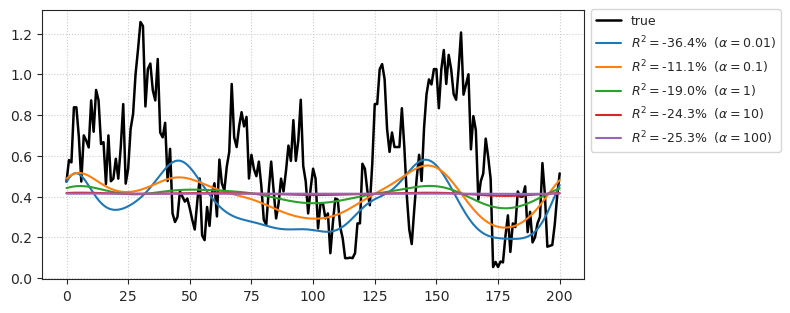

Neuron # 1. lag = 1, r2:
{0.01: -38.377894725809945, 0.1: -9.498493832994036, 1: -18.227497292720063, 10: 
-24.21216817148688, 100: -25.26437348682762}

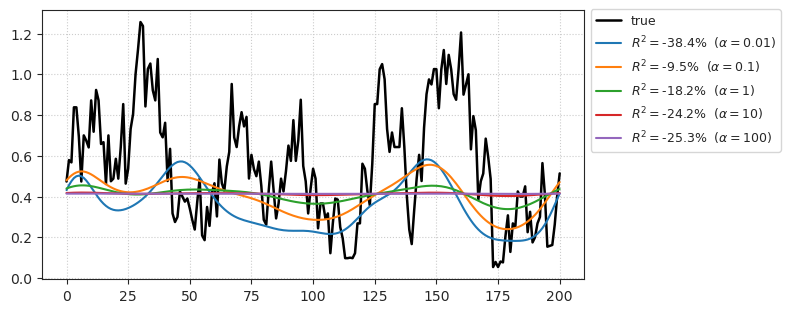

Neuron # 1. lag = 2, r2:
{0.01: -31.530597877612255, 0.1: -7.2123446424512405, 1: -17.40601789300351, 10: 
-24.082031409291417, 100: -25.25053633283949}

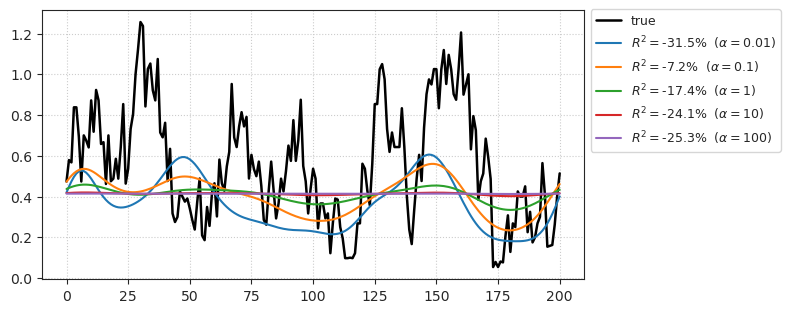

Neuron # 1. lag = 3, r2:
{0.01: -29.080213733641912, 0.1: -5.586293743601578, 1: -16.737947933324815, 10: 
-23.97338314024249, 100: -25.238949308230563}

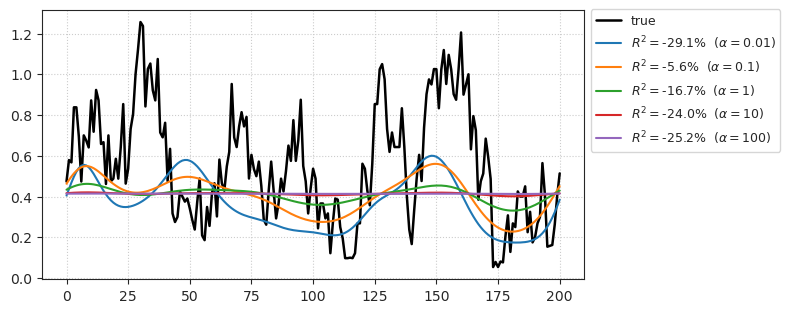

Neuron # 1. lag = 4, r2:
{0.01: -33.89465571528913, 0.1: -5.01026669533291, 1: -16.279436716233175, 10: 
-23.89096135453419, 100: -25.23006489630997}

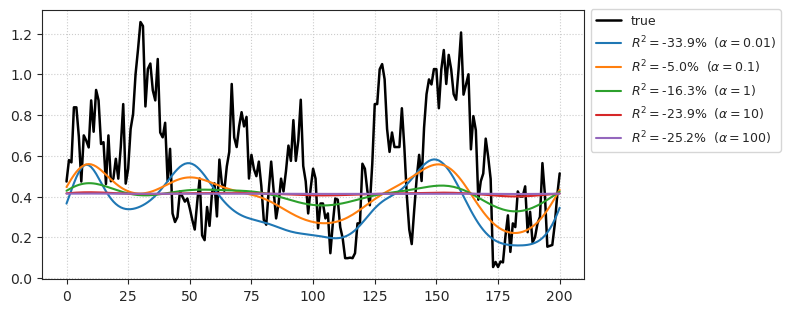

Neuron # 1. lag = 5, r2:
{0.01: -35.56249797497559, 0.1: -4.606555107675736, 1: -15.964535720573348, 10: 
-23.832169195284347, 100: -25.22369853702906}

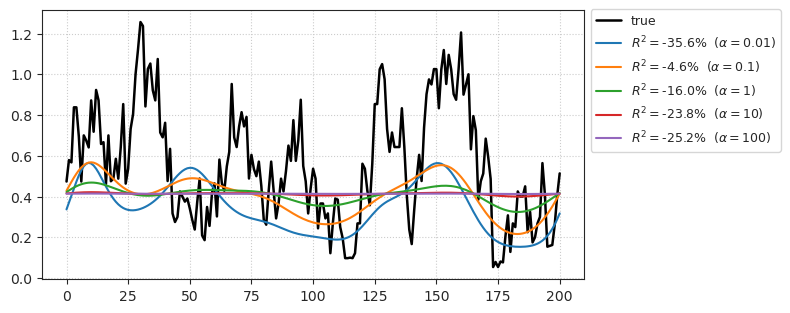

Neuron # 1. lag = 6, r2:
{0.01: -30.801972803467393, 0.1: -3.7596594081491297, 1: -15.729358533630533, 10: 
-23.790558296601418, 100: -25.21920974676113}

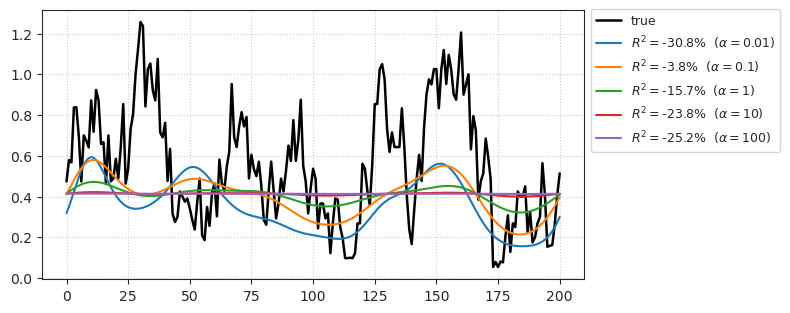

Neuron # 1. lag = 7, r2:
{0.01: -29.556587042436067, 0.1: -4.075090731438835, 1: -15.759252040812587, 10: 
-23.783936293494467, 100: -25.218351474521295}

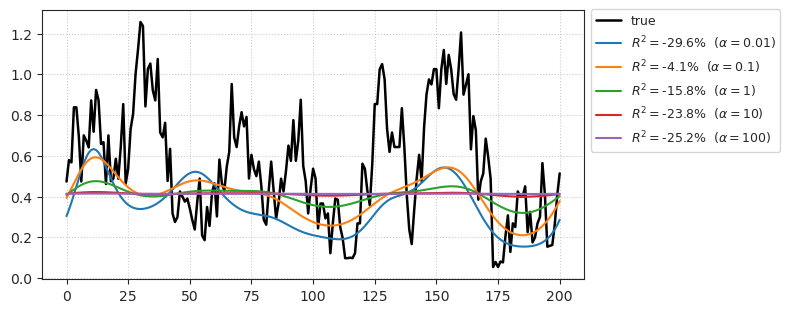

Neuron # 1. lag = 8, r2:
{0.01: -29.254592967542226, 0.1: -4.575749377342753, 1: -15.961952776770172, 10: 
-23.806034897799023, 100: -25.220570892261218}

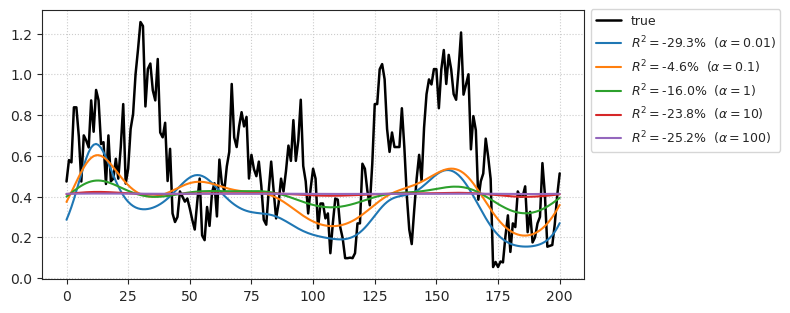

Neuron # 1. lag = 9, r2:
{0.01: -26.059109530051707, 0.1: -5.41599025572479, 1: -16.351305459082543, 10: 
-23.857259622818596, 100: -25.22588818527025}

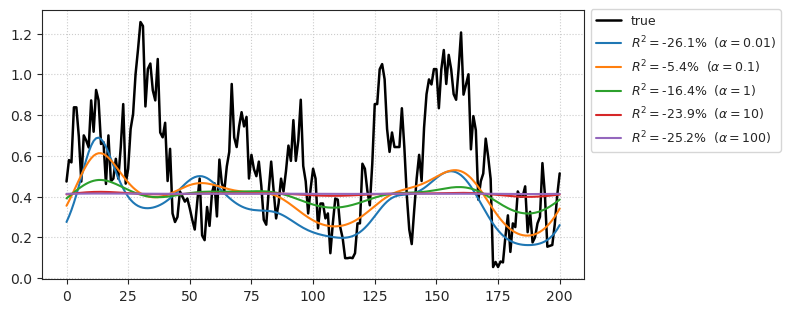

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 3. lag = 0, r2:
{0.01: -16.864163492497084, 0.1: -5.89284727008228, 1: -0.8050167642223327, 10: 
-0.6685234834044707, 100: -0.7064479123444656}

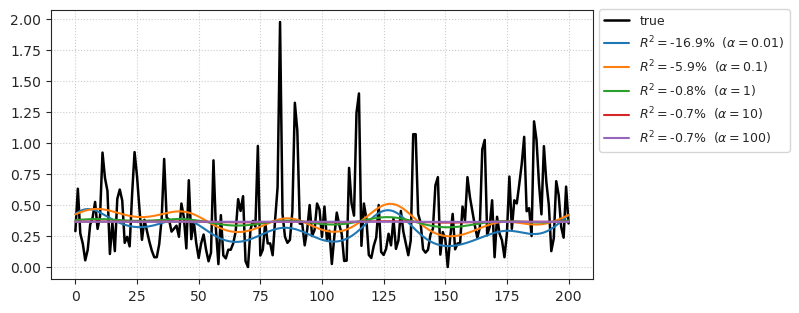

Neuron # 3. lag = 1, r2:
{0.01: -17.833496189447253, 0.1: -6.259771969674466, 1: -0.8338817030248746, 10: 
-0.6687964219010079, 100: -0.7064302597850292}

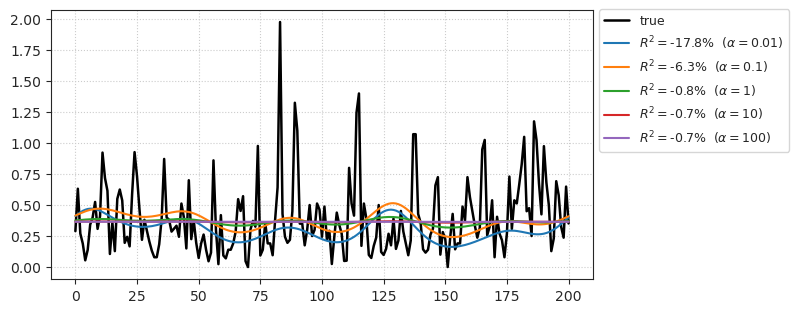

Neuron # 3. lag = 2, r2:
{0.01: -17.87059635552801, 0.1: -6.462538493059133, 1: -0.8626788061685708, 10: 
-0.6707032640924204, 100: -0.7066037743304276}

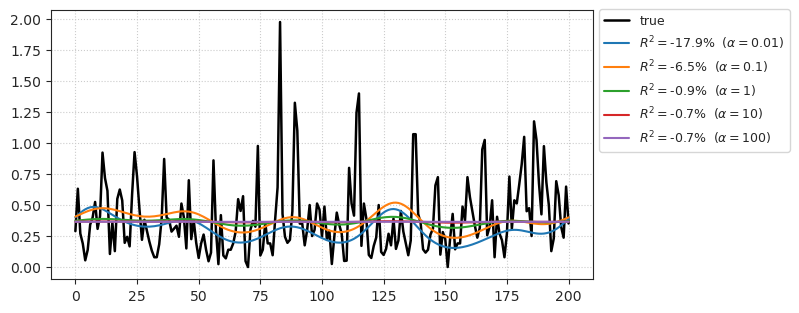

Neuron # 3. lag = 3, r2:
{0.01: -18.07011774848366, 0.1: -6.568631662379887, 1: -0.8892588629016984, 10: 
-0.6733816210763743, 100: -0.7068738837006983}

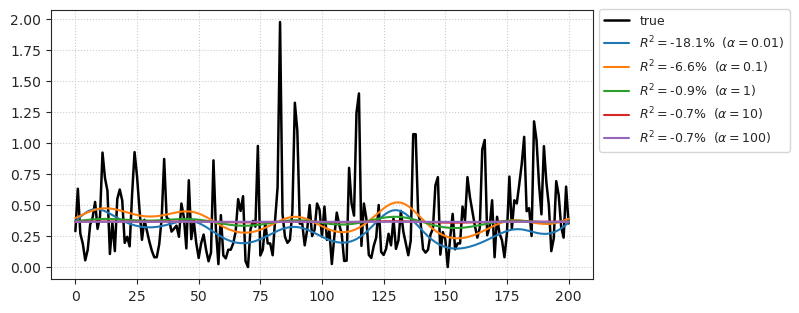

Neuron # 3. lag = 4, r2:
{0.01: -20.661215740411176, 0.1: -6.886474807040033, 1: -0.9576991234682586, 10: 
-0.681865117724878, 100: -0.7077501231242733}

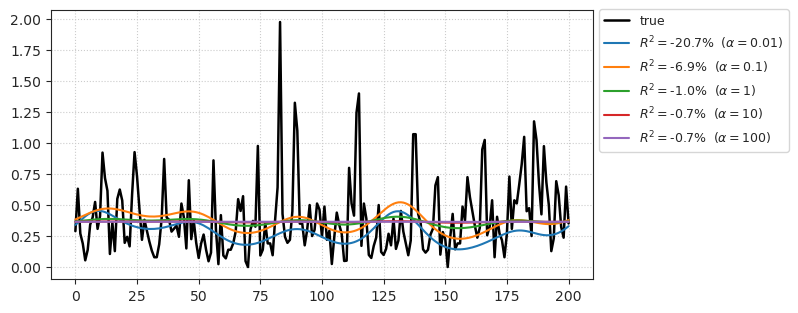

Neuron # 3. lag = 5, r2:
{0.01: -21.638154654339957, 0.1: -7.083267103497892, 1: -1.022472366581506, 10: 
-0.6924794231103926, 100: -0.7088669390266311}

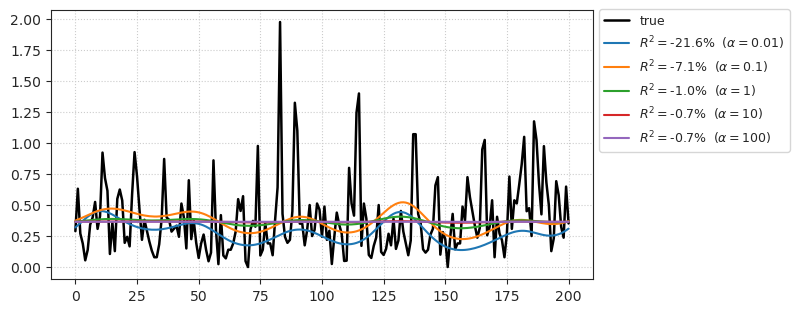

Neuron # 3. lag = 6, r2:
{0.01: -22.312905983290833, 0.1: -7.33840468218987, 1: -1.1270069055081544, 10: 
-0.707683979366025, 100: -0.710469381104617}

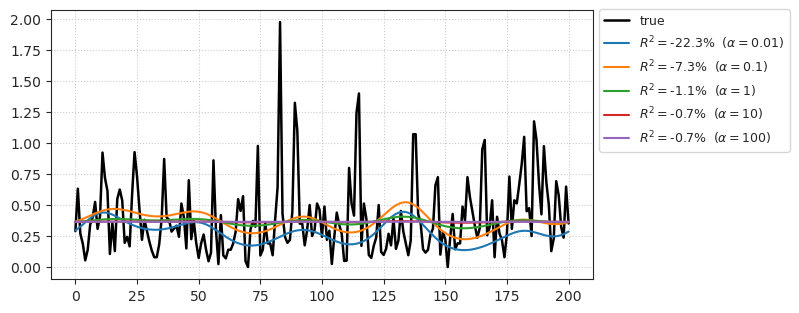

Neuron # 3. lag = 7, r2:
{0.01: -24.990842881881047, 0.1: -7.606327824262671, 1: -1.2447547508310342, 10: 
-0.7251761257861977, 100: -0.7123159032758952}

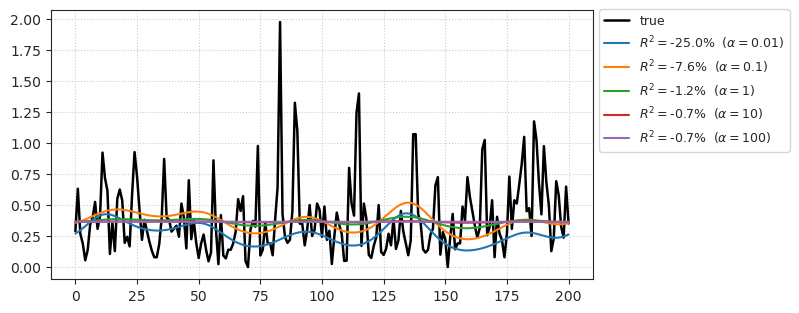

Neuron # 3. lag = 8, r2:
{0.01: -23.89922367341302, 0.1: -7.950919531142642, 1: -1.3900856736755118, 10: 
-0.7467314310581008, 100: -0.7145918376338711}

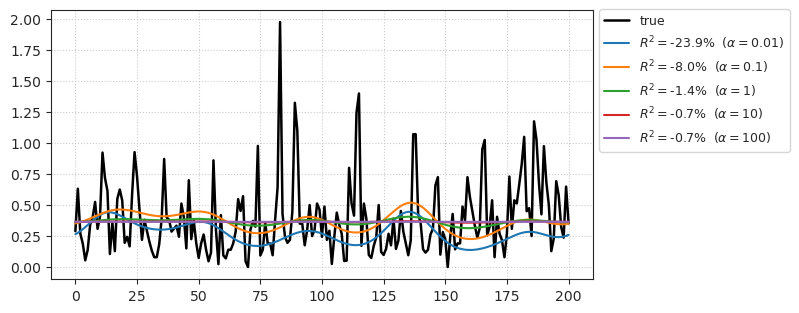

Neuron # 3. lag = 9, r2:
{0.01: -24.987526628323554, 0.1: -8.241581859903002, 1: -1.5310801405512109, 10: 
-0.7675087284809035, 100: -0.716781962613533}

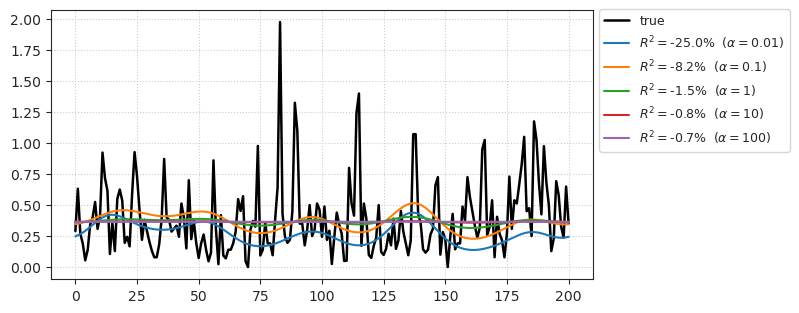

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 4. lag = 0, r2:
{0.01: 4.476487994800804, 0.1: 10.494594935967083, 1: 18.506290705438786, 10: 
-16.640141224570005, 100: -24.345588721556076}

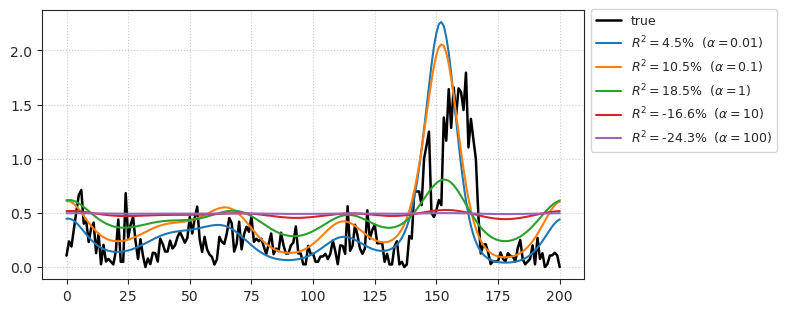

Neuron # 4. lag = 1, r2:
{0.01: -1.3281394388409362, 0.1: 17.147157973320304, 1: 22.095702532902685, 10: 
-16.075865296381366, 100: -24.28394543241481}

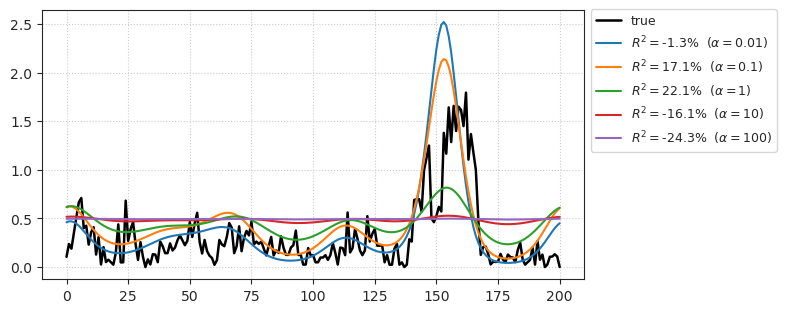

Neuron # 4. lag = 2, r2:
{0.01: 7.613433561658023, 0.1: 25.826251452728698, 1: 24.936208945582795, 10: 
-15.662175193289606, 100: -24.239045111609727}

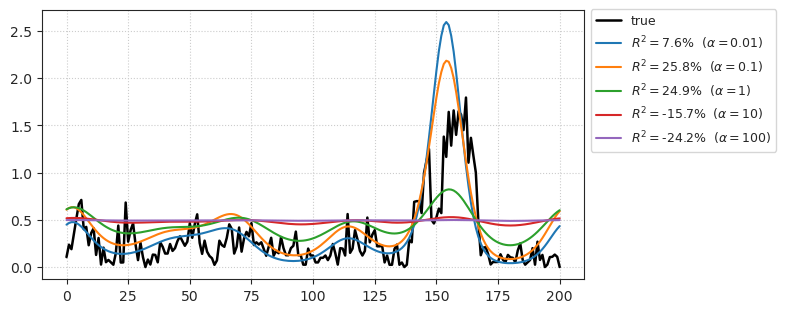

Neuron # 4. lag = 3, r2:
{0.01: 9.00022839987753, 0.1: 33.8271455720366, 1: 26.75772829237353, 10: 
-15.435996455171974, 100: -24.21493979597269}

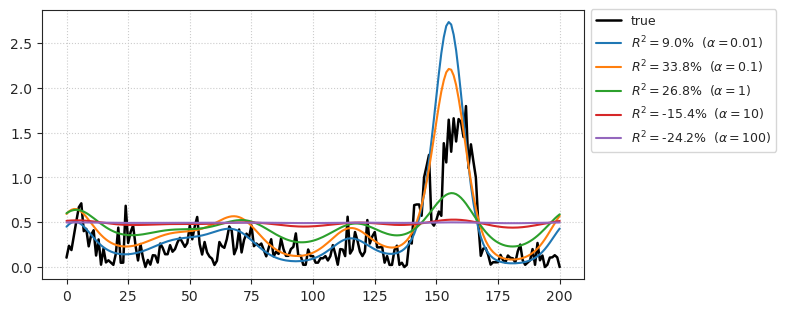

Neuron # 4. lag = 4, r2:
{0.01: 15.243779433845484, 0.1: 41.207414698976194, 1: 27.43437438204689, 10: 
-15.406386027018272, 100: -24.212467416581298}

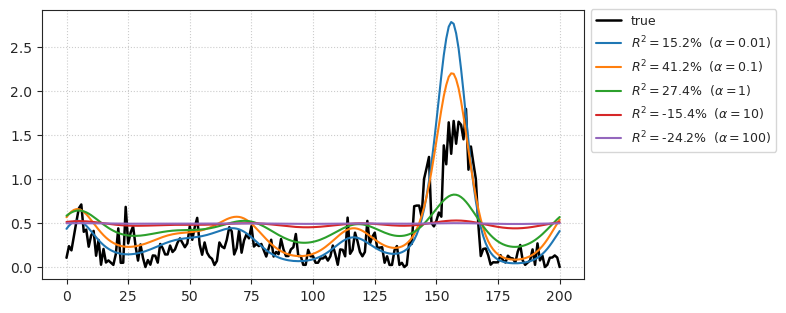

Neuron # 4. lag = 5, r2:
{0.01: 22.43359895539705, 0.1: 46.70367338756394, 1: 26.929191320021527, 10: 
-15.56428529201892, 100: -24.230451666569785}

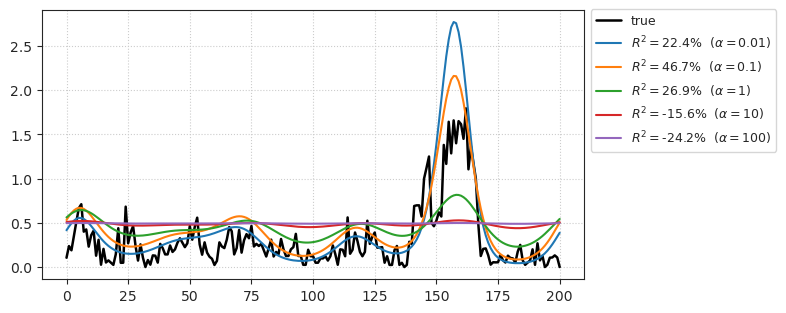

Neuron # 4. lag = 6, r2:
{0.01: 24.55102272869564, 0.1: 49.279623774715084, 1: 25.20768906688223, 10: 
-15.912299046477463, 100: -24.269179442278865}

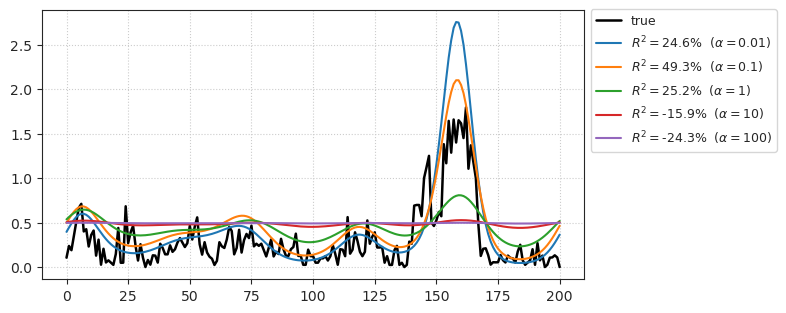

Neuron # 4. lag = 7, r2:
{0.01: 9.573794965625071, 0.1: 48.131197464454225, 1: 22.426572707474346, 10: 
-16.424609187408823, 100: -24.325890231834357}

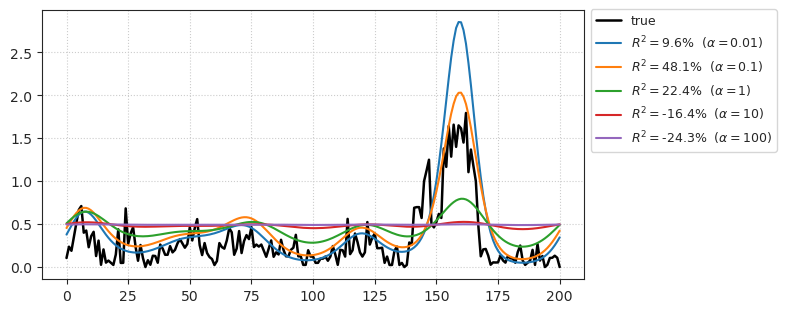

Neuron # 4. lag = 8, r2:
{0.01: 15.836804672377514, 0.1: 45.04826031105208, 1: 18.683450259532087, 10: 
-17.074633115771086, 100: -24.397413792804734}

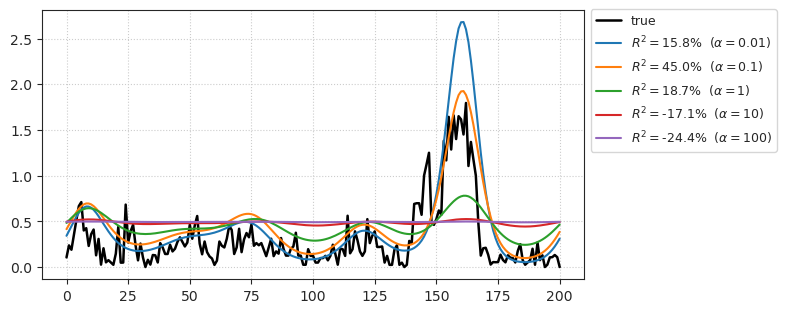

Neuron # 4. lag = 9, r2:
{0.01: 21.639209847656172, 0.1: 39.48372571298828, 1: 14.23186681754519, 10: 
-17.834563616645372, 100: -24.48092131636914}

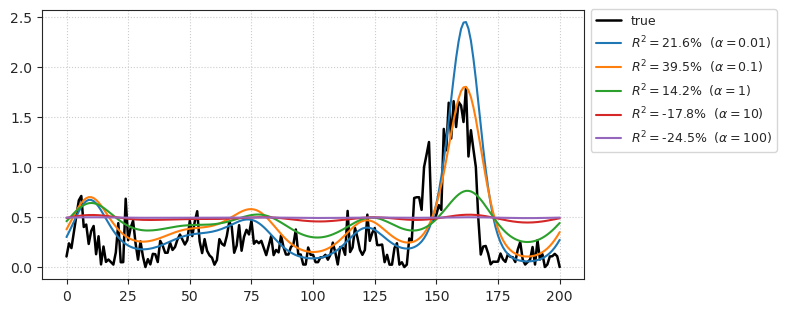

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 5. lag = 0, r2:
{0.01: -92.3050990077092, 0.1: 22.85879497482124, 1: 15.599928854392564, 10: 
2.761351775105869, 100: -1.9632458135947939}

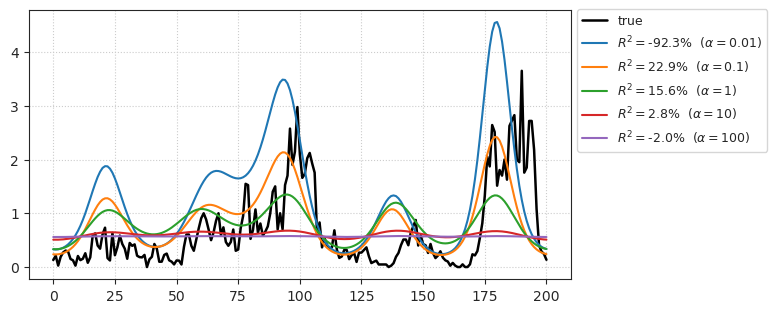

Neuron # 5. lag = 1, r2:
{0.01: -92.23084473706098, 0.1: 29.9970220314146, 1: 19.774523786249986, 10: 
3.634135217798762, 100: -1.8677783358620248}

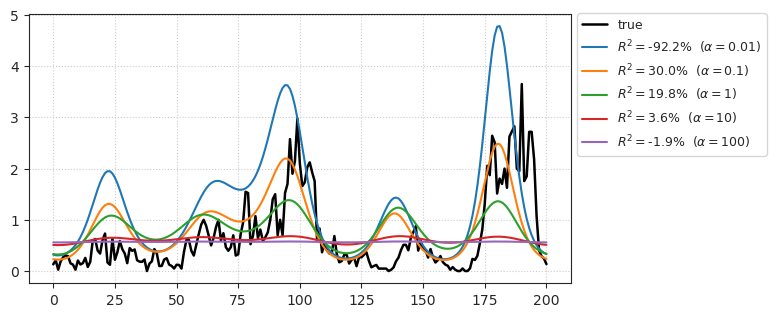

Neuron # 5. lag = 2, r2:
{0.01: -67.92579631559555, 0.1: 37.48645149419082, 1: 23.62679945119428, 10: 
4.38704094505219, 100: -1.7861425405743425}

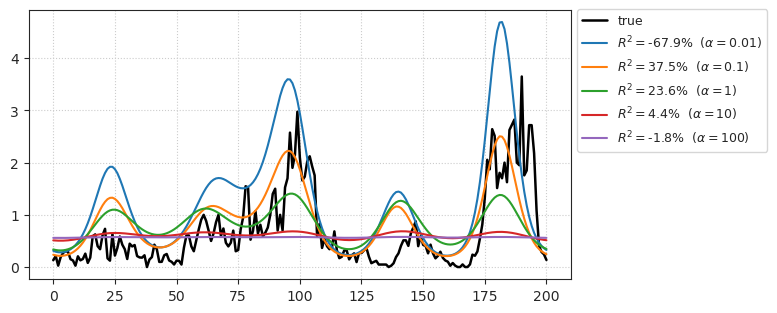

Neuron # 5. lag = 3, r2:
{0.01: -53.24393918526309, 0.1: 43.7890985896898, 1: 26.696487101891975, 10: 
4.965707788479035, 100: -1.7236974047363463}

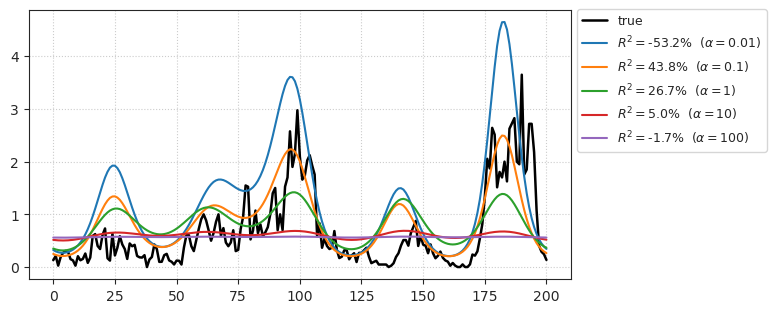

Neuron # 5. lag = 4, r2:
{0.01: -64.81641009645622, 0.1: 48.613897481276425, 1: 28.891564070694663, 10: 
5.352863513815043, 100: -1.6821918815151937}

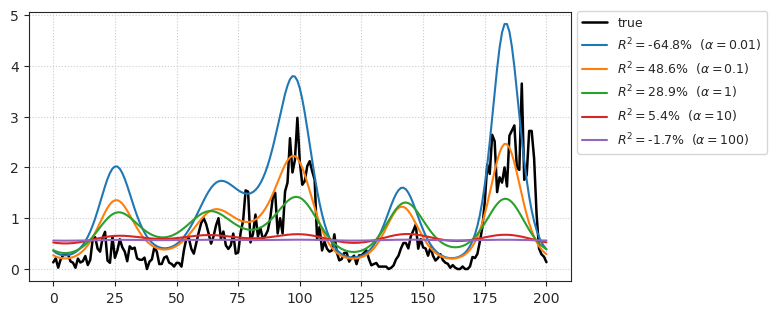

Neuron # 5. lag = 5, r2:
{0.01: -79.58630219425812, 0.1: 51.70972693425713, 1: 30.034181340415202, 10: 
5.524331800438476, 100: -1.664034609090348}

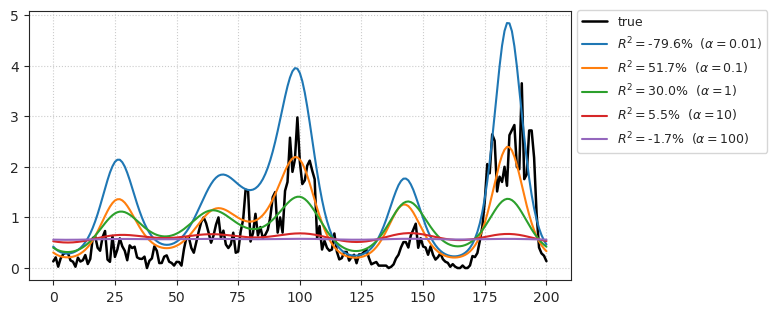

Neuron # 5. lag = 6, r2:
{0.01: -74.96385899403522, 0.1: 53.443924240525796, 1: 30.153377314877762, 10: 
5.480779753743425, 100: -1.669143516467031}

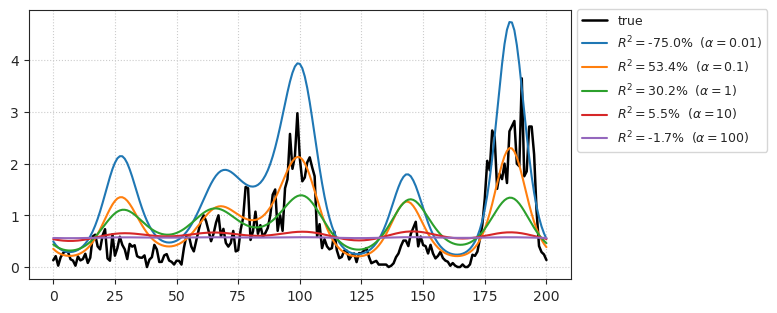

Neuron # 5. lag = 7, r2:
{0.01: -31.316446998879165, 0.1: 53.1001603900513, 1: 29.094119500632885, 10: 
5.2148947744853125, 100: -1.6980674114435823}

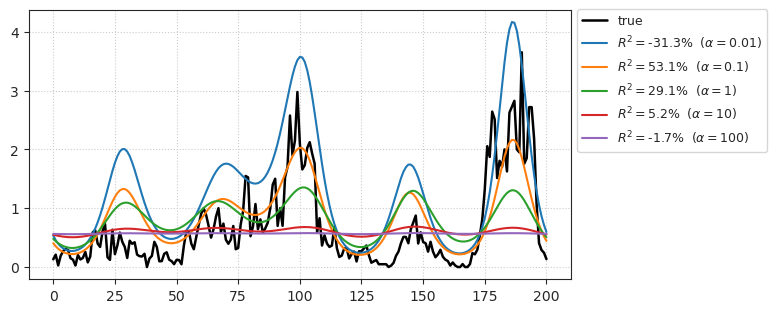

Neuron # 5. lag = 8, r2:
{0.01: -6.289150225599638, 0.1: 50.589240712403935, 1: 27.07141909460631, 10: 
4.756622052203607, 100: -1.7479036443673213}

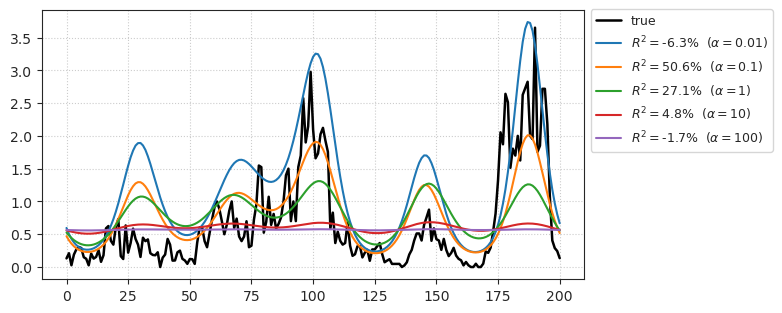

Neuron # 5. lag = 9, r2:
{0.01: -15.33569152849148, 0.1: 45.568196045159446, 1: 24.086145382218294, 10: 
4.126974588140763, 100: -1.8163302310897134}

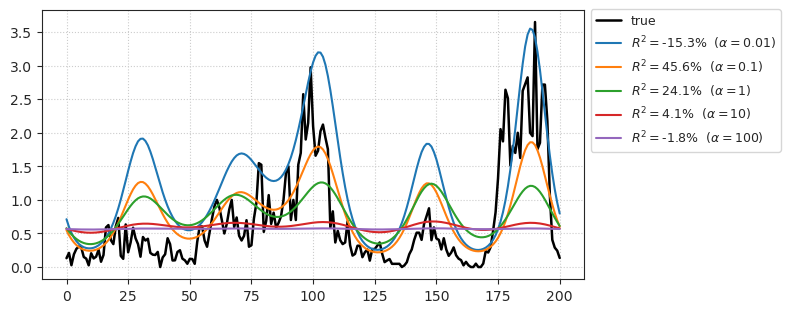

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 6. lag = 0, r2:
{0.01: -58.61548728986716, 0.1: -46.49959789769393, 1: -34.64402580469654, 10: 
-30.236498156153257, 100: -29.658086180873976}

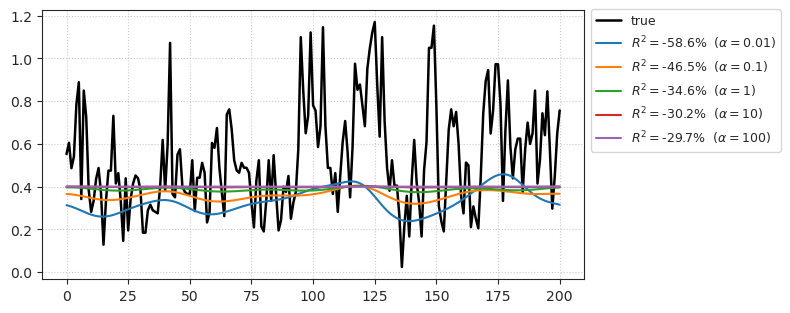

Neuron # 6. lag = 1, r2:
{0.01: -61.79223991819662, 0.1: -48.35917388558224, 1: -35.1971948359036, 10: 
-30.309694329273242, 100: -29.66566694166346}

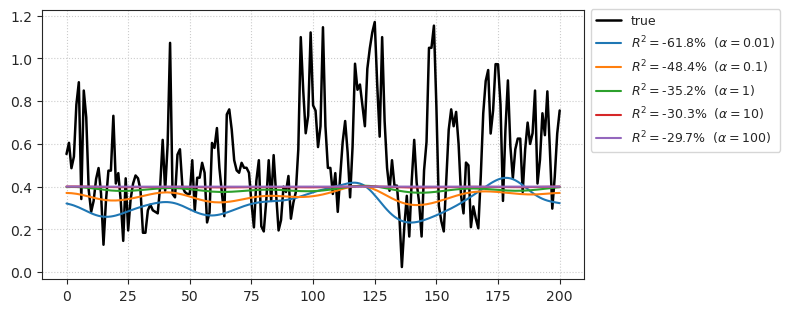

Neuron # 6. lag = 2, r2:
{0.01: -61.56683024227607, 0.1: -49.820584096004936, 1: -35.717905803529845, 10: 
-30.380728937725475, 100: -29.673051895393666}

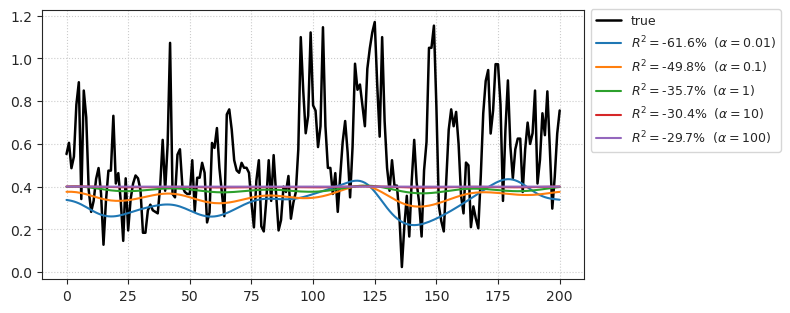

Neuron # 6. lag = 3, r2:
{0.01: -58.99998849816295, 0.1: -51.02354026616523, 1: -36.244126311701464, 10: 
-30.45508499878684, 100: -29.680813674885886}

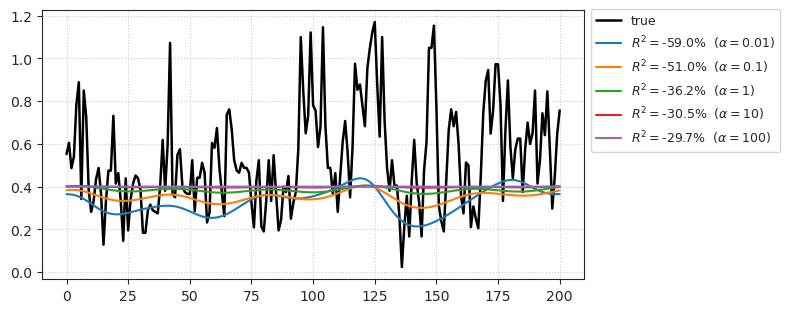

Neuron # 6. lag = 4, r2:
{0.01: -51.521822490020575, 0.1: -51.78721189624022, 1: -36.758114183105306, 10: 
-30.530880343058197, 100: -29.688768133975362}

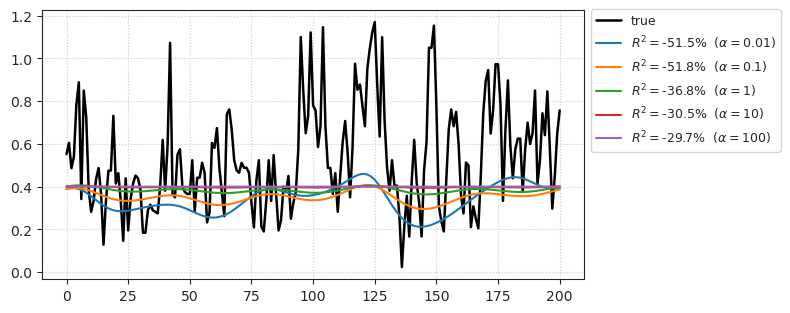

Neuron # 6. lag = 5, r2:
{0.01: -54.185234099892355, 0.1: -53.656589531993085, 1: -37.40290217013891, 10: 
-30.621658098866035, 100: -29.698243321041673}

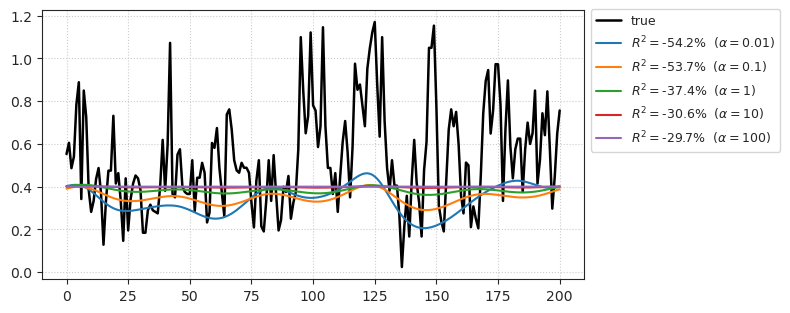

Neuron # 6. lag = 6, r2:
{0.01: -52.97402260787629, 0.1: -54.895870615367116, 1: -37.99283528222295, 10: 
-30.708207545090758, 100: -29.707323571350443}

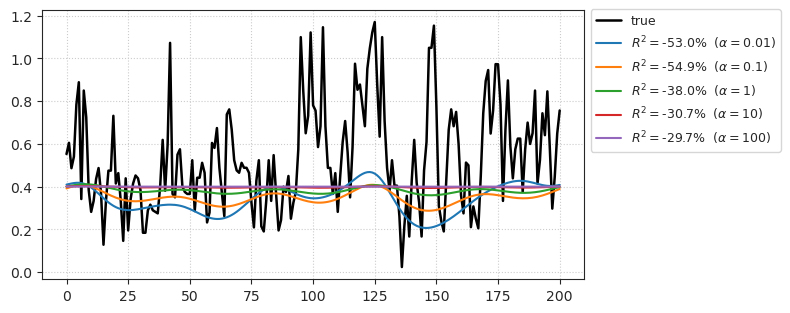

Neuron # 6. lag = 7, r2:
{0.01: -38.30020283441302, 0.1: -54.83607368615677, 1: -38.50704594688597, 10: 
-30.790281397847473, 100: -29.71601424696322}

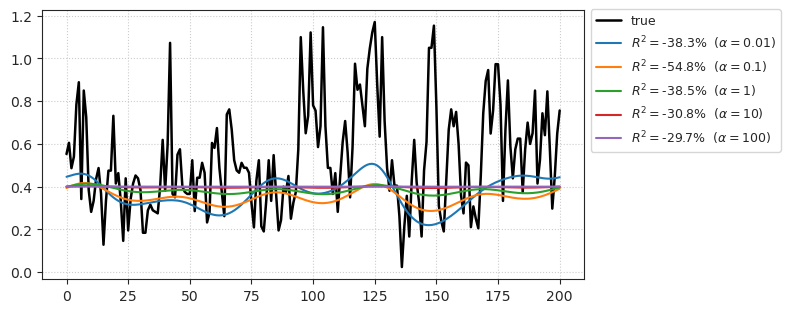

Neuron # 6. lag = 8, r2:
{0.01: -31.116597413455516, 0.1: -55.48218053090039, 1: -39.07006956071915, 10: 
-30.877879351389794, 100: -29.72526640971185}

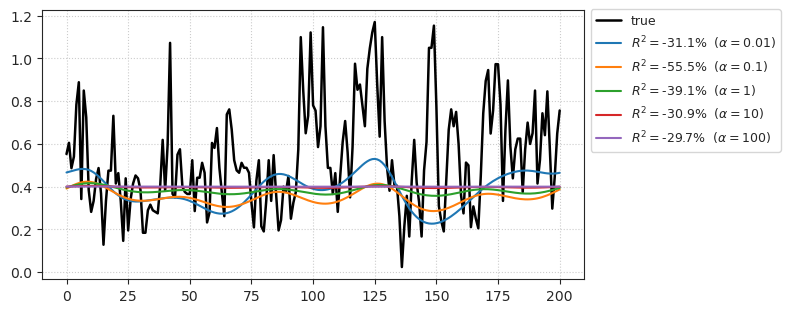

Neuron # 6. lag = 9, r2:
{0.01: -34.06510270115803, 0.1: -57.291606956577844, 1: -39.72746744369153, 10: 
-30.974032279675413, 100: -29.7353558625177}

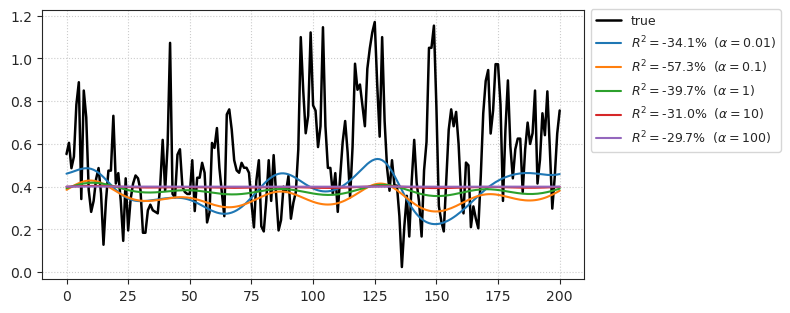

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 7. lag = 0, r2:
{0.01: 57.89520991684442, 0.1: 41.8534591907535, 1: 9.488614267666629, 10: 
-5.342280586211534, 100: -7.801028838644086}

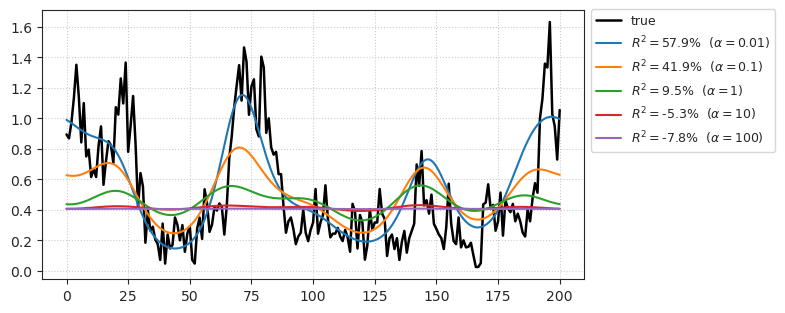

Neuron # 7. lag = 1, r2:
{0.01: 60.444558880938246, 0.1: 44.57117695395853, 1: 10.668269597519298, 10: 
-5.164956091167205, 100: -7.7824144640270765}

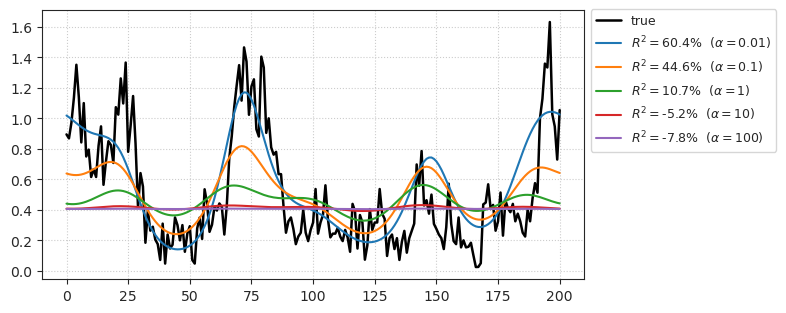

Neuron # 7. lag = 2, r2:
{0.01: 64.26852343997473, 0.1: 46.3890718048393, 1: 11.589454544195565, 10: 
-5.024494056051432, 100: -7.767660078738059}

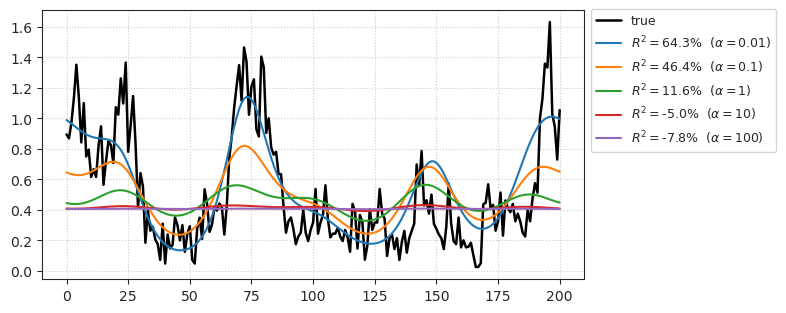

Neuron # 7. lag = 3, r2:
{0.01: 64.83518300246094, 0.1: 47.52238524725867, 1: 12.268961332051642, 10: 
-4.918716596925421, 100: -7.75646745970342}

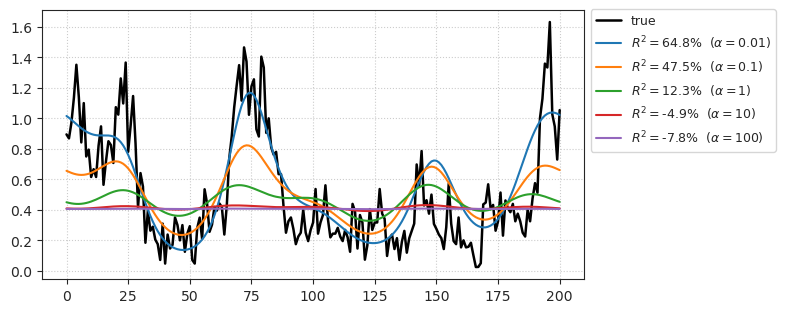

Neuron # 7. lag = 4, r2:
{0.01: 65.54693298587672, 0.1: 47.678621590654465, 1: 12.633623052120669, 10: 
-4.857845340294942, 100: -7.750045752385848}

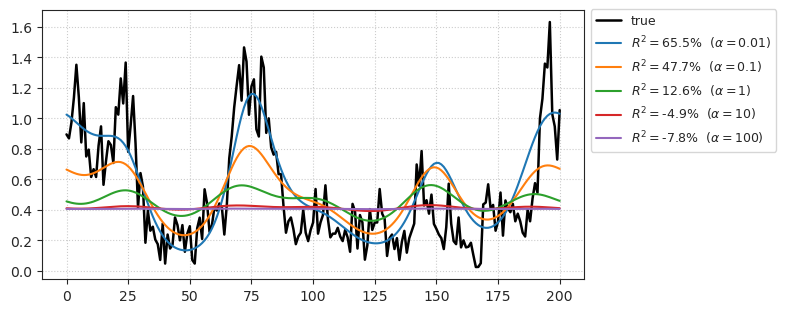

Neuron # 7. lag = 5, r2:
{0.01: 63.56917788142946, 0.1: 46.88623868074705, 1: 12.652526637712125, 10: 
-4.8461785127496215, 100: -7.748747035071224}

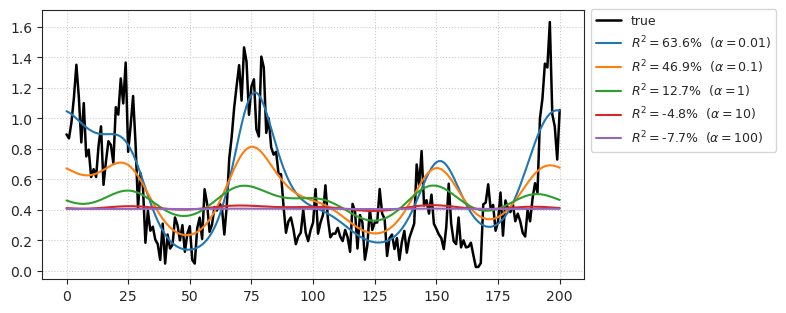

Neuron # 7. lag = 6, r2:
{0.01: 61.64551414133159, 0.1: 44.91954176125073, 1: 12.267787160851096, 10: 
-4.891532689108802, 100: -7.753389743102712}

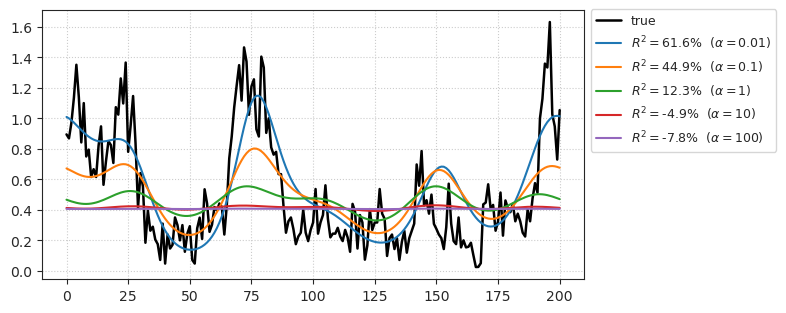

Neuron # 7. lag = 7, r2:
{0.01: 57.52040582712106, 0.1: 41.879923208721124, 1: 11.528723223323933, 10: 
-4.987617221446317, 100: -7.76333722471807}

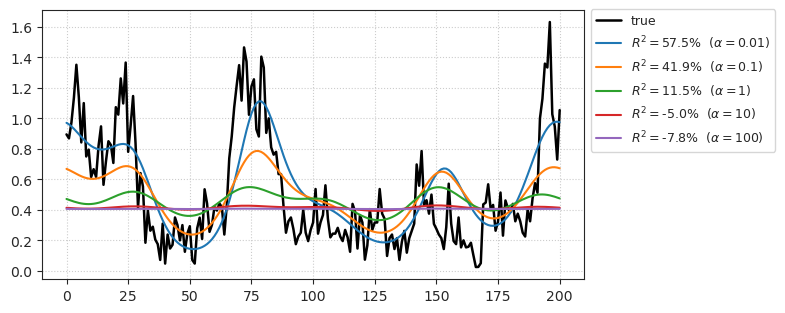

Neuron # 7. lag = 8, r2:
{0.01: 53.39516065685799, 0.1: 38.42926427864738, 1: 10.51309859257078, 10: 
-5.12935414750888, 100: -7.778136476023612}

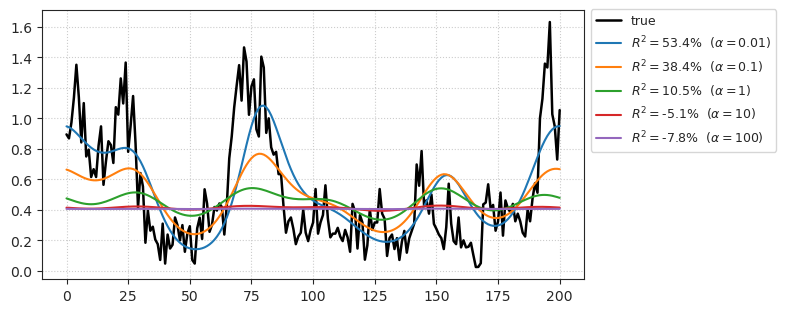

Neuron # 7. lag = 9, r2:
{0.01: 47.896684097085526, 0.1: 34.172126876416385, 1: 9.202641428127055, 10: 
-5.316659551213432, 100: -7.797764457091683}

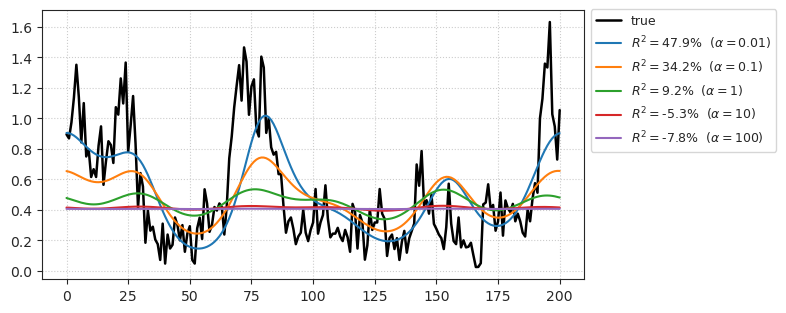

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 8. lag = 0, r2:
{0.01: -414.33618220140795, 0.1: -15.71612939758431, 1: 29.841978508406275, 10: 
4.568762086923206, 100: -0.3353858603839299}

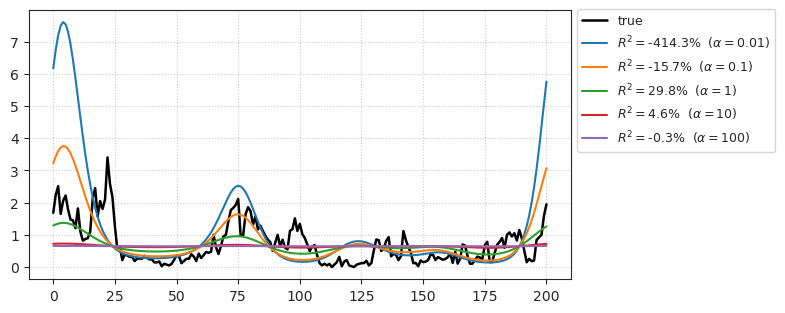

Neuron # 8. lag = 1, r2:
{0.01: -548.3533087548572, 0.1: -24.59356900800207, 1: 32.45812339454801, 10: 
5.017045082810312, 100: -0.2880892763289955}

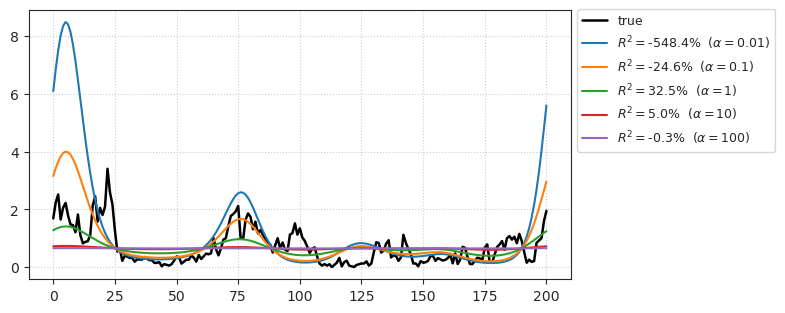

Neuron # 8. lag = 2, r2:
{0.01: -444.103465168979, 0.1: -27.90392689029555, 1: 34.526688825843564, 10: 
5.376800213580902, 100: -0.25009738508734447}

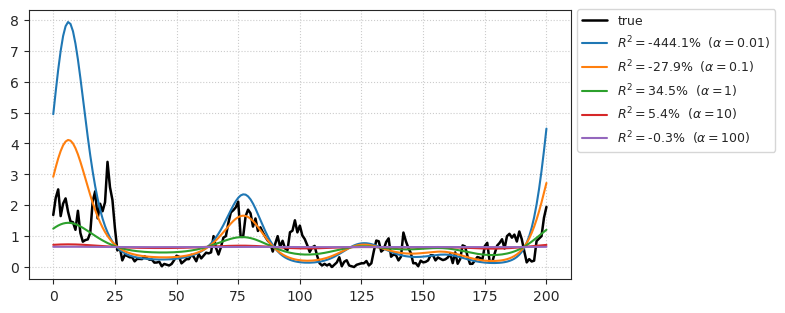

Neuron # 8. lag = 3, r2:
{0.01: -357.8126360613227, 0.1: -30.605604061669478, 1: 36.07280081174261, 10: 
5.65611012657341, 100: -0.22051762413373144}

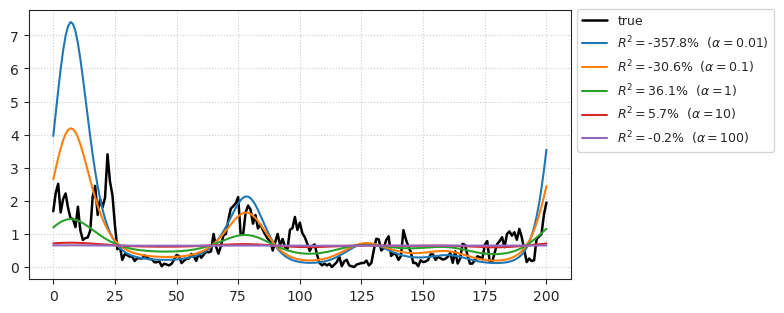

Neuron # 8. lag = 4, r2:
{0.01: -288.8587479183993, 0.1: -31.18140825246687, 1: 37.047487427779544, 10: 
5.837794754728531, 100: -0.20122720127413452}

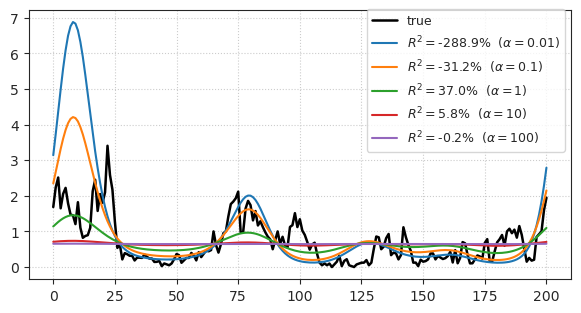

Neuron # 8. lag = 5, r2:
{0.01: -220.18967529034717, 0.1: -29.522909908772622, 1: 37.44357433972523, 10: 
5.916675102146396, 100: -0.19275916154637418}

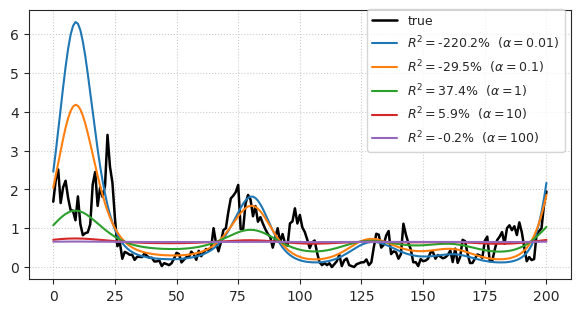

Neuron # 8. lag = 6, r2:
{0.01: -167.65700679493852, 0.1: -24.218572943773342, 1: 37.22919692256519, 10: 
5.880724539677473, 100: -0.19654638700108418}

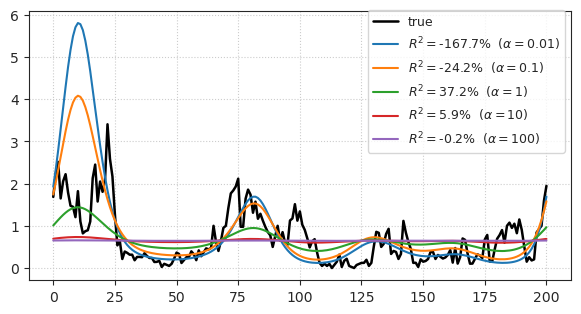

Neuron # 8. lag = 7, r2:
{0.01: -134.47598936733849, 0.1: -18.025662382129127, 1: 36.52191131920344, 10: 
5.7461460870463, 100: -0.2108906298923685}

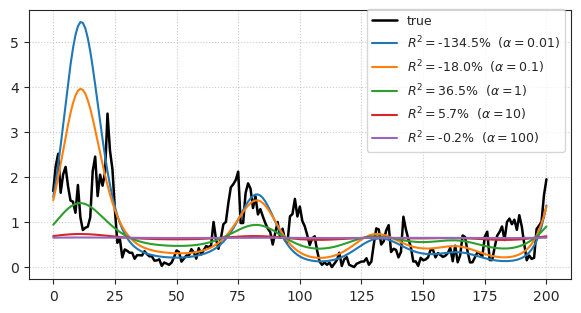

Neuron # 8. lag = 8, r2:
{0.01: -126.8085743711199, 0.1: -11.072828260287748, 1: 35.30072925416394, 10: 
5.508514414408561, 100: -0.23630799468725705}

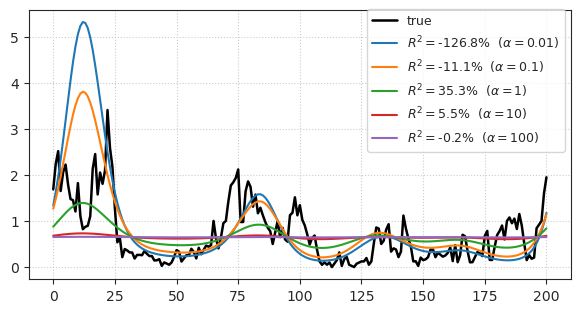

Neuron # 8. lag = 9, r2:
{0.01: -59.6255585767427, 0.1: -0.6253955471475781, 1: 33.559926194420555, 10: 
5.178326454049209, 100: -0.2715413454200677}

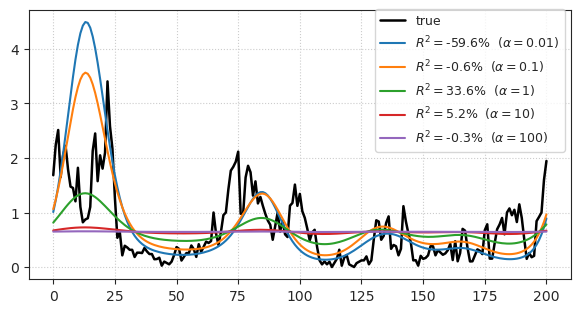

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 9. lag = 0, r2:
{0.01: 5.850278156107514, 0.1: 2.022785675024208, 1: -1.5823123434313802, 10: 
-2.510582904410774, 100: -2.6402286187694024}

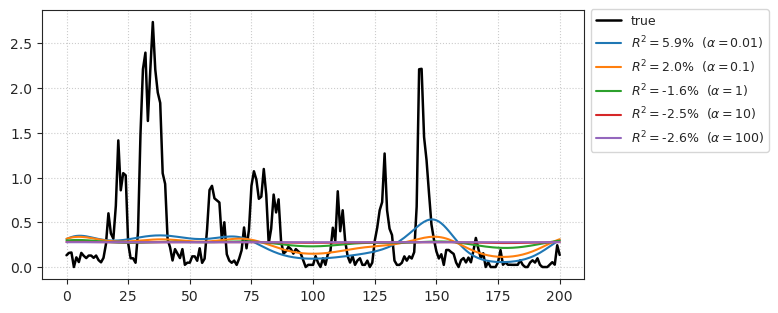

Neuron # 9. lag = 1, r2:
{0.01: 6.696297861419809, 0.1: 2.221834718042892, 1: -1.5196549520917868, 10: 
-2.502128978375695, 100: -2.639344957032841}

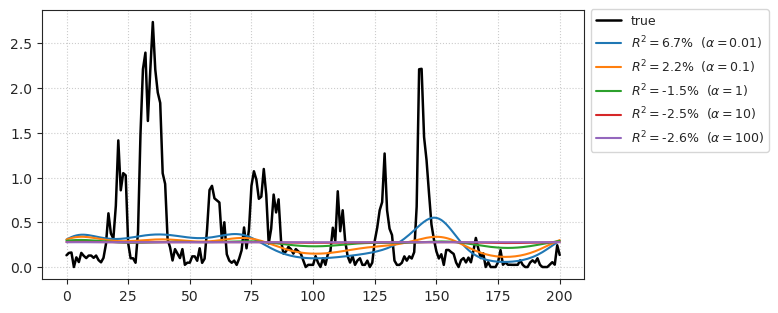

Neuron # 9. lag = 2, r2:
{0.01: 6.7649357205786576, 0.1: 2.353081255455891, 1: -1.458630449341336, 10: 
-2.4935395054369147, 100: -2.6384470728882725}

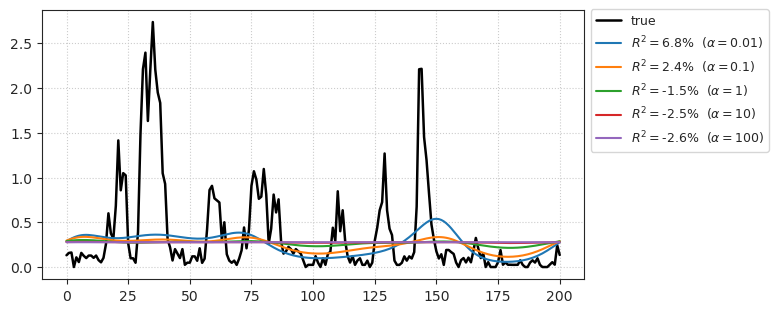

Neuron # 9. lag = 3, r2:
{0.01: 7.018607404903876, 0.1: 2.520006475671843, 1: -1.3827346962928644, 10: 
-2.4833825941475096, 100: -2.6373916137448994}

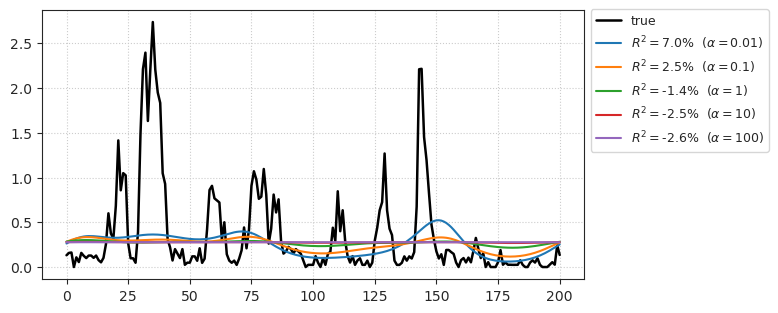

Neuron # 9. lag = 4, r2:
{0.01: 7.639740265955785, 0.1: 2.75502579523621, 1: -1.2985130143235546, 10: 
-2.4725210172964918, 100: -2.636267314424523}

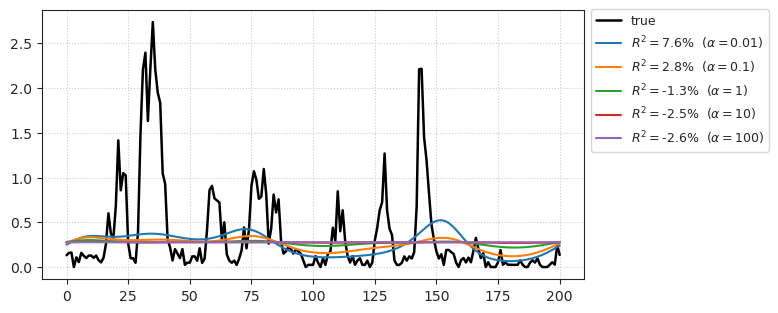

Neuron # 9. lag = 5, r2:
{0.01: 8.360858753094968, 0.1: 2.969075940074617, 1: -1.2137591930073688, 10: 
-2.4618761088142094, 100: -2.6351660538561195}

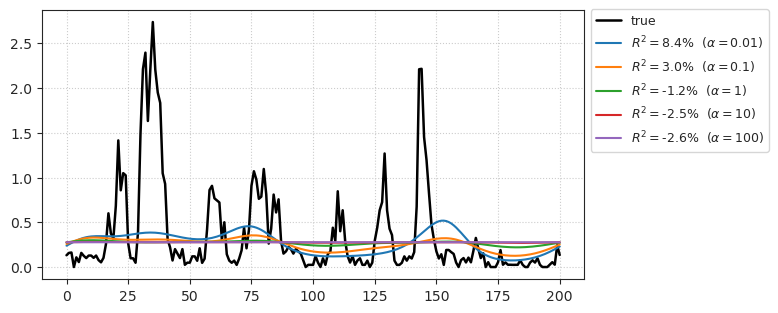

Neuron # 9. lag = 6, r2:
{0.01: 8.432352180694192, 0.1: 3.1266596871817876, 1: -1.1365627993066063, 10: 
-2.4511398496272596, 100: -2.634052082369709}

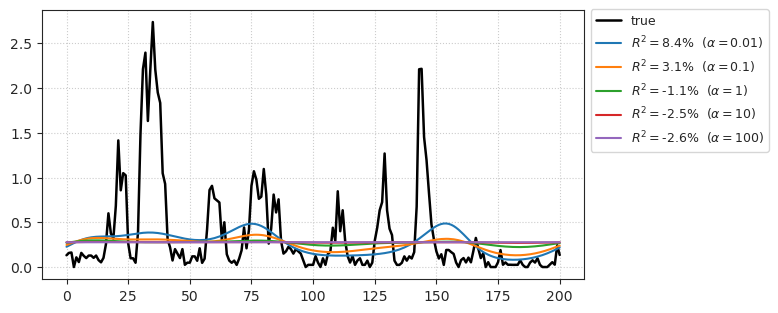

Neuron # 9. lag = 7, r2:
{0.01: 7.609440065950668, 0.1: 3.1733330331012666, 1: -1.0533318867347319, 10: 
-2.4403089862478744, 100: -2.6329211194348723}

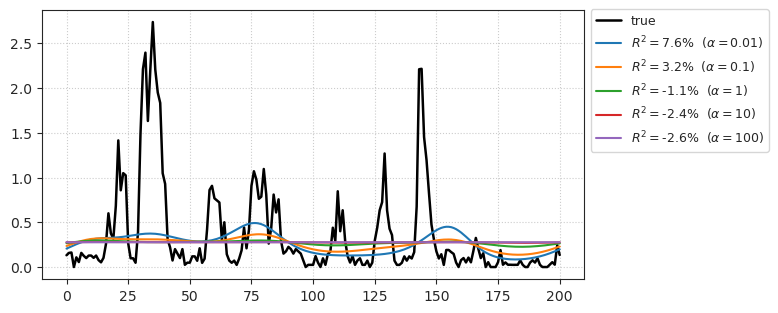

Neuron # 9. lag = 8, r2:
{0.01: 7.713602846080992, 0.1: 3.3054539221165857, 1: -0.9707595201511765, 10: 
-2.42935662533057, 100: -2.631780638927772}

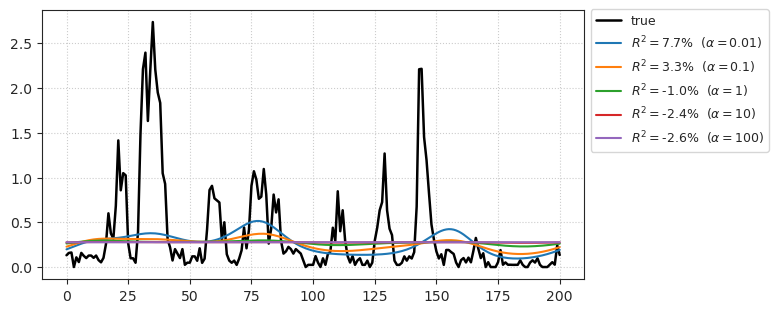

Neuron # 9. lag = 9, r2:
{0.01: 7.64863009945106, 0.1: 3.3816331117908605, 1: -0.8938041903032046, 10: 
-2.4200232265341626, 100: -2.6308092864962163}

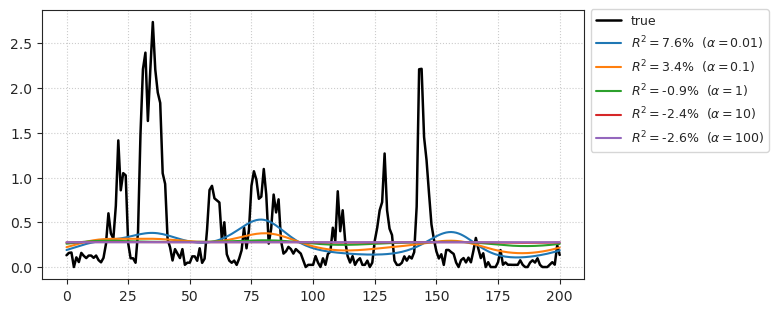

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 11. lag = 0, r2:
{0.01: -56.071656962323836, 0.1: 26.567292584175117, 1: 7.443291844060774, 10: 
0.8053818029133519, 100: 0.023624066114280584}

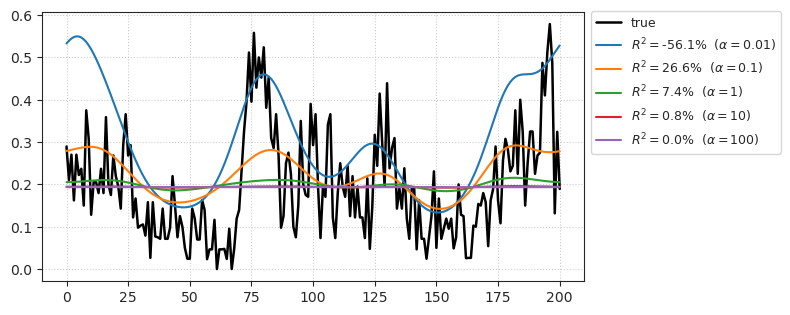

Neuron # 11. lag = 1, r2:
{0.01: -65.86174969859482, 0.1: 26.86706753694821, 1: 7.6706237796388965, 10: 
0.8343977330715013, 100: 0.026596945129686578}

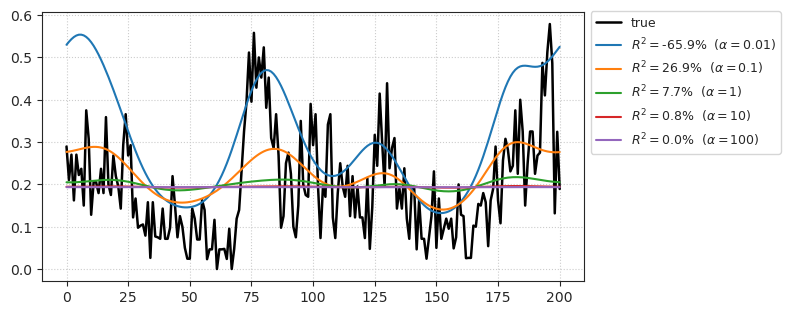

Neuron # 11. lag = 2, r2:
{0.01: -77.46316401157985, 0.1: 26.862325189177973, 1: 7.835015259071509, 10: 
0.8564589470477224, 100: 0.028869489848903918}

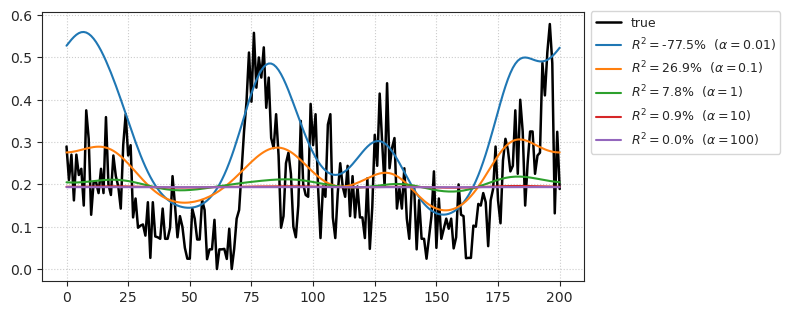

Neuron # 11. lag = 3, r2:
{0.01: -82.22188802178074, 0.1: 26.61561512920875, 1: 7.890305119541285, 10: 
0.8655805238064085, 100: 0.029827541105387212}

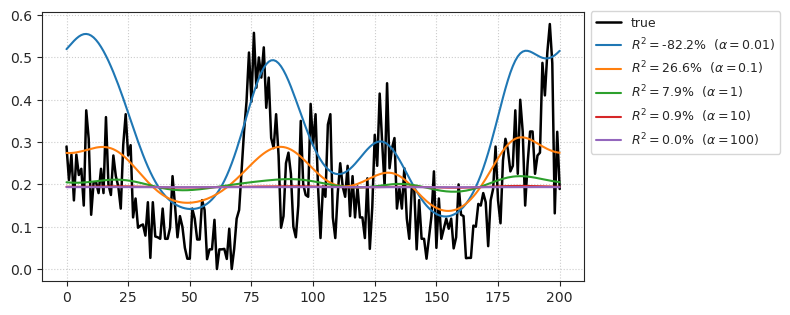

Neuron # 11. lag = 4, r2:
{0.01: -75.3000599543671, 0.1: 25.967230178498856, 1: 7.783652482945136, 10: 
0.8558155364673081, 100: 0.028870812229742082}

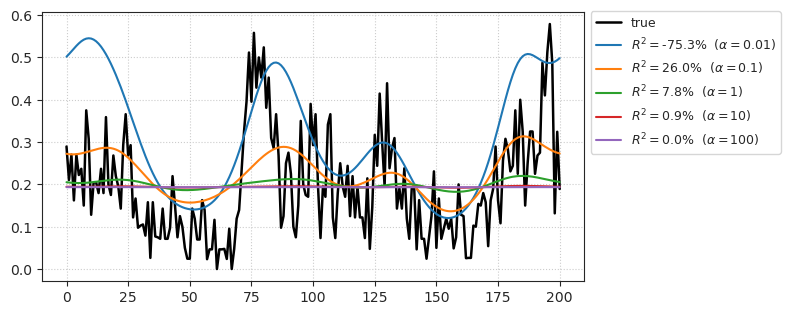

Neuron # 11. lag = 5, r2:
{0.01: -79.22195987460555, 0.1: 25.09435772197707, 1: 7.638761399651162, 10: 
0.8418871202326539, 100: 0.02749597661333425}

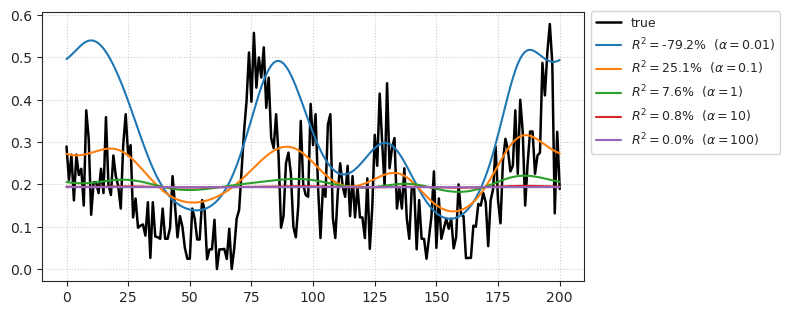

Neuron # 11. lag = 6, r2:
{0.01: -75.75437596039716, 0.1: 23.74298508592757, 1: 7.342393606595854, 10: 
0.8105502108044282, 100: 0.024359799308670826}

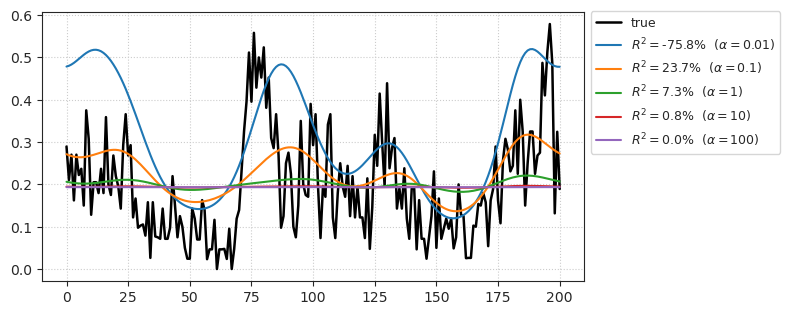

Neuron # 11. lag = 7, r2:
{0.01: -69.69670760857909, 0.1: 22.25022538314554, 1: 6.963451054780833, 10: 
0.768963678496104, 100: 0.020176778548119945}

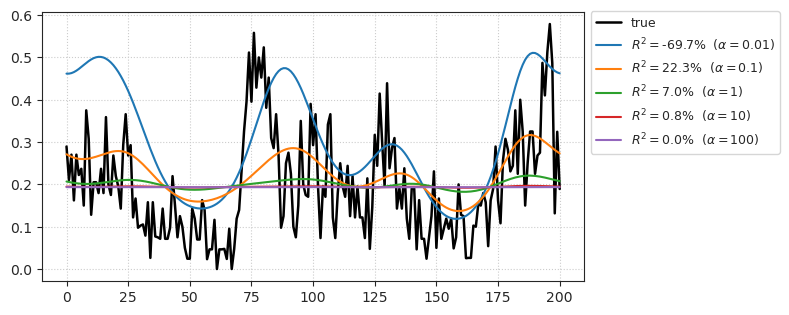

Neuron # 11. lag = 8, r2:
{0.01: -69.20205106195007, 0.1: 20.663336510596274, 1: 6.539881391746361, 10: 
0.7217881340452648, 100: 0.015423097281153098}

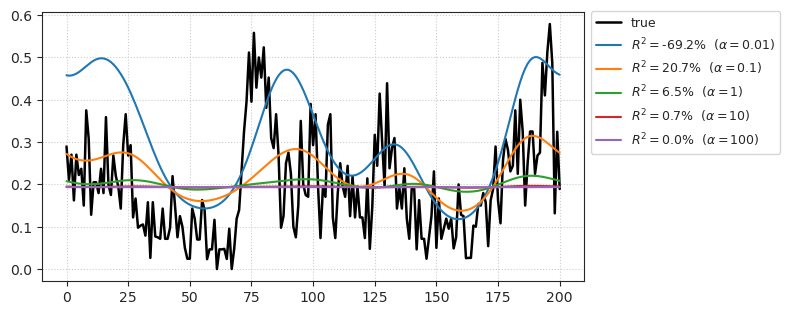

Neuron # 11. lag = 9, r2:
{0.01: -75.37449006350143, 0.1: 18.69548542661982, 1: 6.029777506985024, 10: 
0.6646459263461413, 100: 0.009659749961921094}

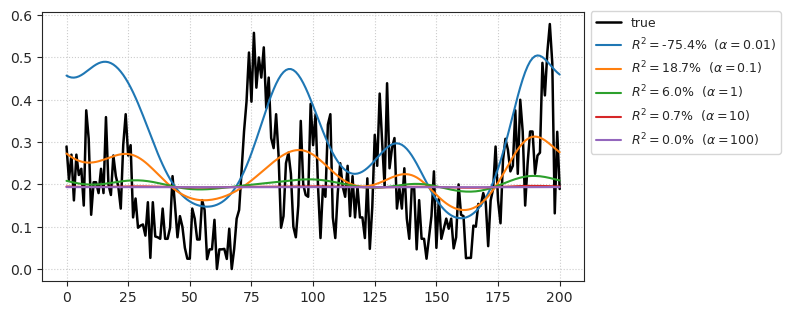

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 12. lag = 0, r2:
{0.01: -100.51573859046954, 0.1: -23.835432130350554, 1: -20.289509283013697, 10: 
-21.097741607417795, 100: -21.22168721654363}

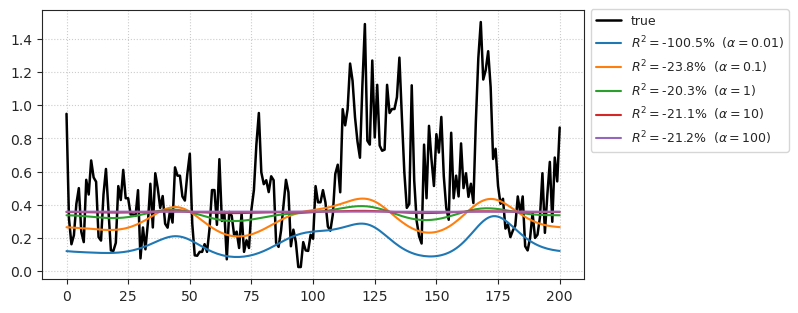

Neuron # 12. lag = 1, r2:
{0.01: -96.26343492193475, 0.1: -23.795002943419984, 1: -20.2794839391359, 10: 
-21.08802552321034, 100: -21.220501518878578}

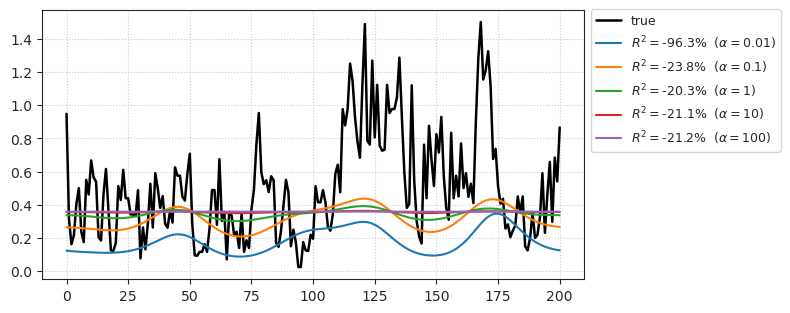

Neuron # 12. lag = 2, r2:
{0.01: -93.04949844280081, 0.1: -24.042097108262617, 1: -20.334416709386115, 10: 
-21.087847343109644, 100: -21.220332625451732}

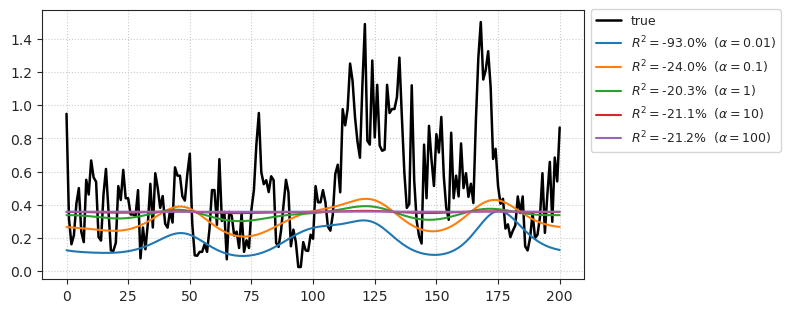

Neuron # 12. lag = 3, r2:
{0.01: -97.30552958514838, 0.1: -25.076561123889075, 1: -20.495094502670153, 10: 
-21.101675624946694, 100: -21.221637765565514}

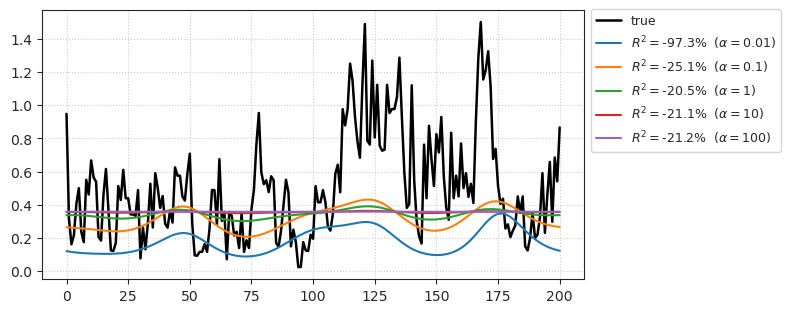

Neuron # 12. lag = 4, r2:
{0.01: -99.58529042703417, 0.1: -25.915189531523808, 1: -20.671658573003548, 10: 
-21.121800277947344, 100: -21.22367214276948}

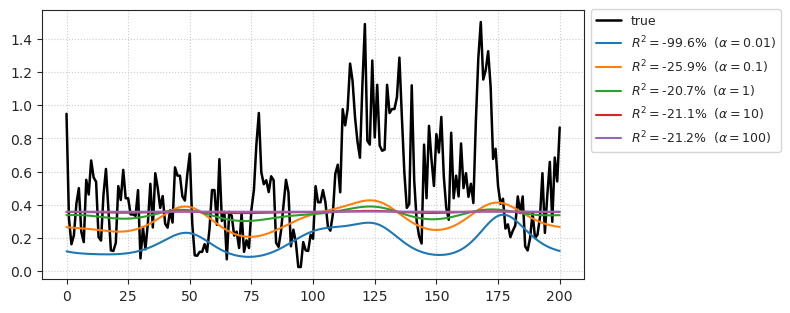

Neuron # 12. lag = 5, r2:
{0.01: -98.83513969873971, 0.1: -26.469758443129376, 1: -20.87152950174529, 10: 
-21.14903947553868, 100: -21.22651355368297}

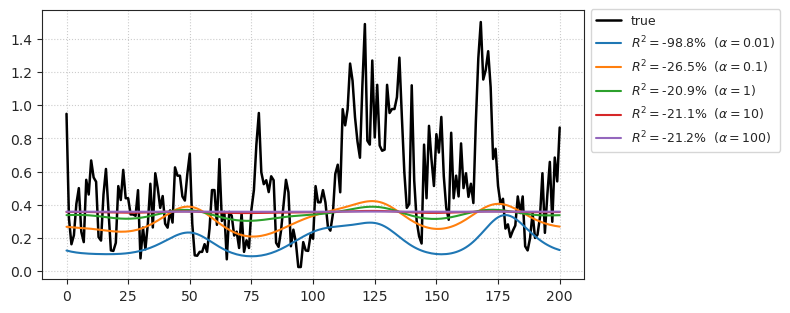

Neuron # 12. lag = 6, r2:
{0.01: -98.13079961150406, 0.1: -26.998695117202697, 1: -21.094469146683913, 10: 
-21.182749130436584, 100: -21.230086339157662}

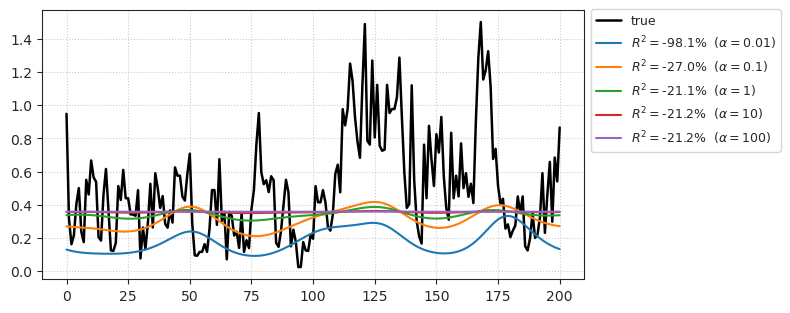

Neuron # 12. lag = 7, r2:
{0.01: -93.90516813204779, 0.1: -27.155638833769146, 1: -21.316339932390882, 10: 
-21.220173045530323, 100: -21.23410748366674}

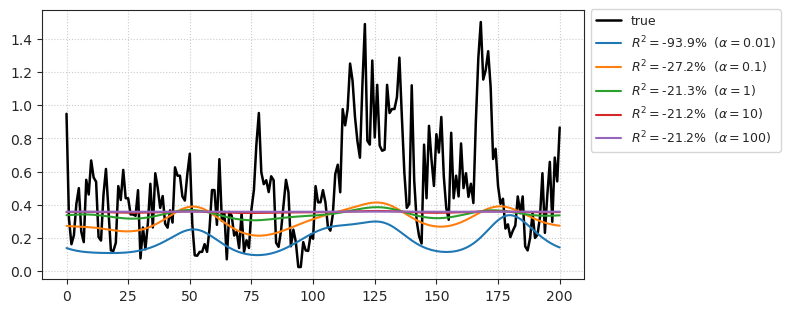

Neuron # 12. lag = 8, r2:
{0.01: -88.840259025712, 0.1: -27.16067317067692, 1: -21.5570274727898, 10: 
-21.262900416690766, 100: -21.23872915506484}

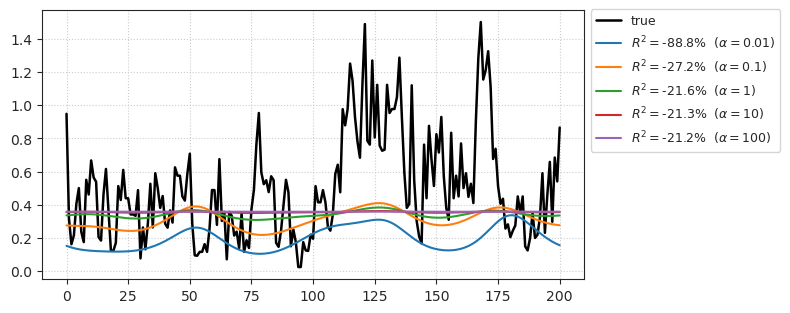

Neuron # 12. lag = 9, r2:
{0.01: -88.3238490336635, 0.1: -27.7088288171607, 1: -21.862161558488346, 10: 
-21.313708019730583, 100: -21.244195566914104}

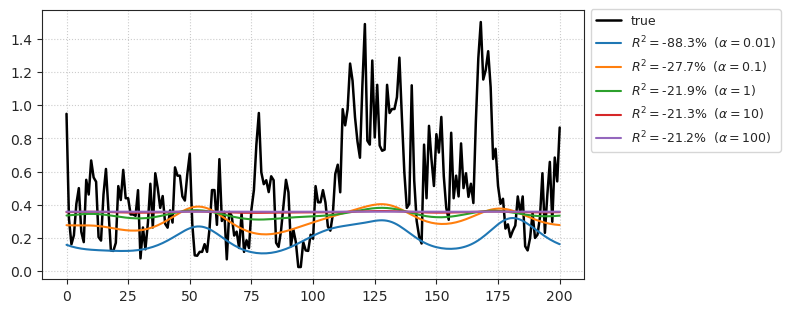

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 13. lag = 0, r2:
{0.01: 14.674573291713589, 0.1: -25.17866501478794, 1: -28.924686848062642, 10: 
-31.822162775279427, 100: -32.7618796592849}

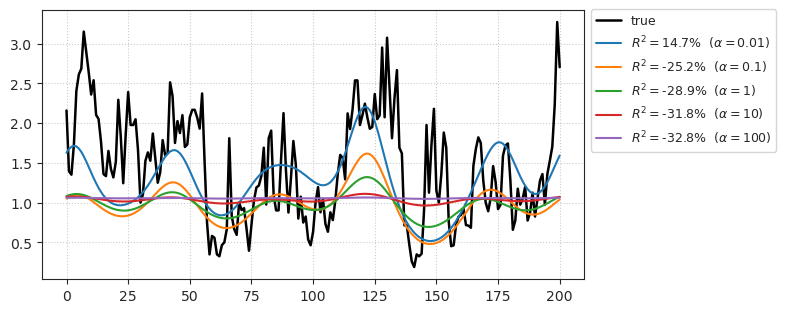

Neuron # 13. lag = 1, r2:
{0.01: 24.861797743762615, 0.1: -22.46832588025147, 1: -28.25822212914011, 10: 
-31.552891455808396, 100: -32.725855129125094}

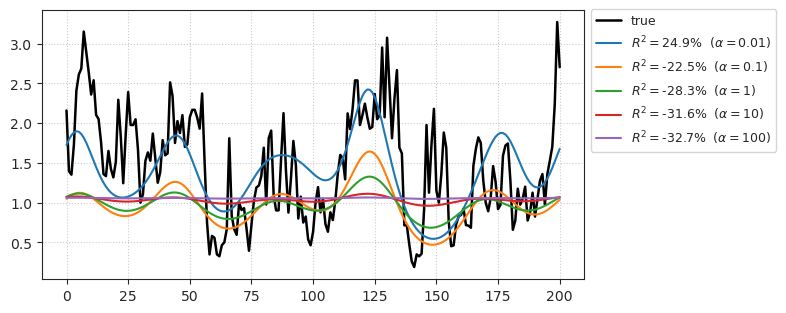

Neuron # 13. lag = 2, r2:
{0.01: 28.372911448230585, 0.1: -21.60314510176622, 1: -28.02426326053238, 10: 
-31.37457252534532, 100: -32.700679654533445}

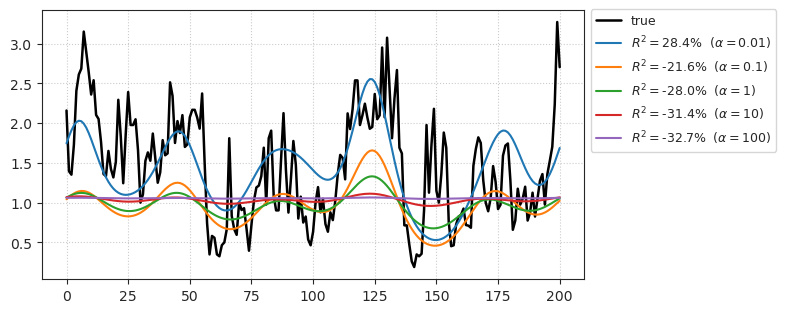

Neuron # 13. lag = 3, r2:
{0.01: 32.51464916498297, 0.1: -21.417314655781226, 1: -28.21039052828076, 10: 
-31.30274151592993, 100: -32.68850892241812}

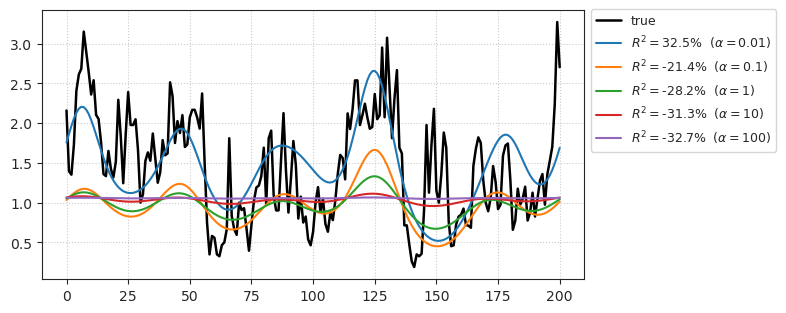

Neuron # 13. lag = 4, r2:
{0.01: 26.4516700876109, 0.1: -20.331921720295163, 1: -28.568781330161876, 10: 
-31.31539722304644, 100: -32.687444129295095}

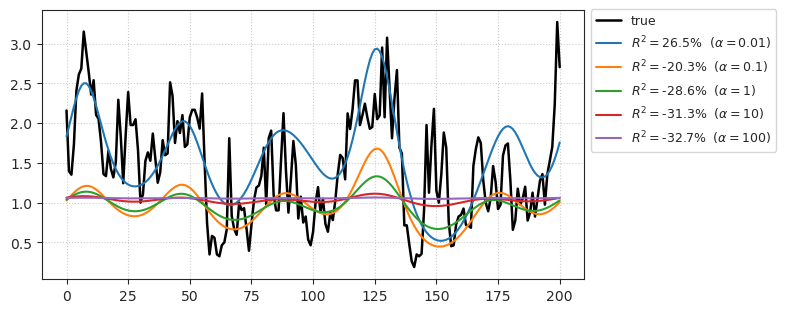

Neuron # 13. lag = 5, r2:
{0.01: 8.141616107985373, 0.1: -20.337689458536758, 1: -29.36429987912803, 10: 
-31.438467268681713, 100: -32.69989426556834}

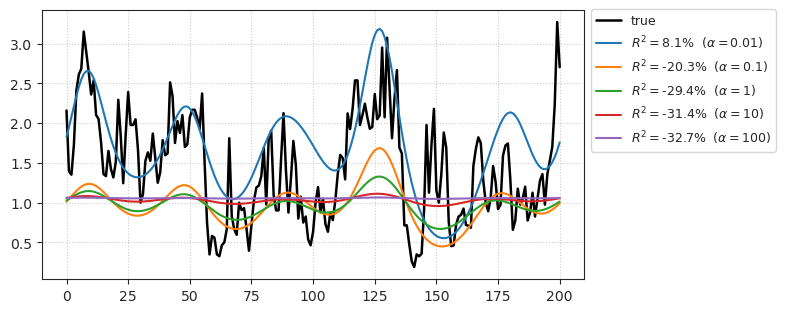

Neuron # 13. lag = 6, r2:
{0.01: 18.270410884319343, 0.1: -23.535814383365206, 1: -30.758161237585348, 10: 
-31.682016162783878, 100: -32.72673490759948}

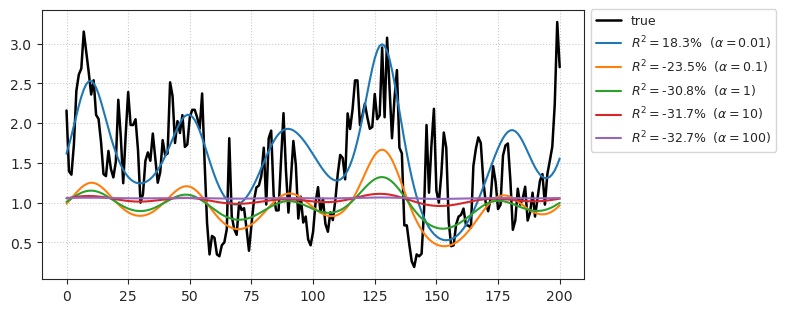

Neuron # 13. lag = 7, r2:
{0.01: 8.718457411407666, 0.1: -24.728217339834945, 1: -32.12846124297493, 10: 
-31.979457794436517, 100: -32.76138385181648}

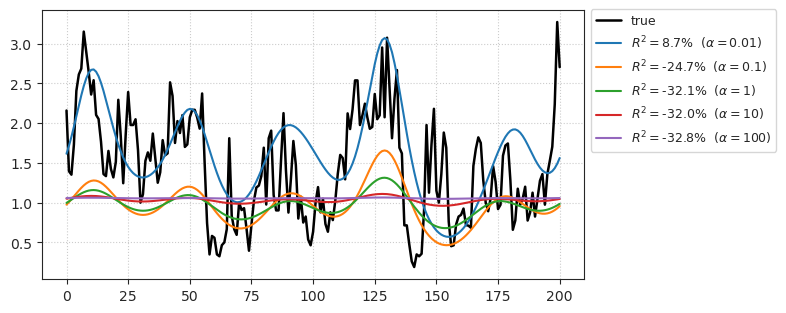

Neuron # 13. lag = 8, r2:
{0.01: 1.0666931023915804, 0.1: -26.570948154148798, 1: -33.75172309111283, 10: 
-32.34984763487445, 100: -32.80524935875662}

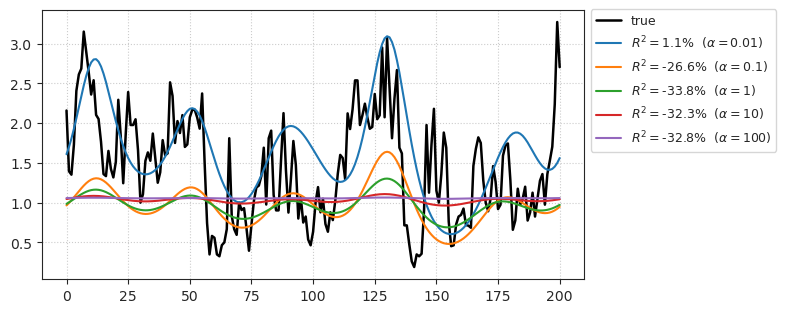

Neuron # 13. lag = 9, r2:
{0.01: -8.60369245213677, 0.1: -28.661088686402913, 1: -35.42698640333366, 10: 
-32.75330669772194, 100: -32.85377921401405}

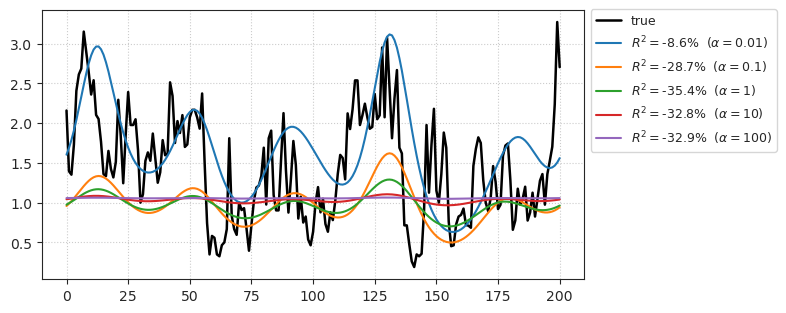

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

Neuron # 14. lag = 0, r2:
{0.01: 4.522528348912836, 0.1: 6.087434714334172, 1: 2.5219201896947374, 10: 
0.7120581653261349, 100: 0.031053604280073532}

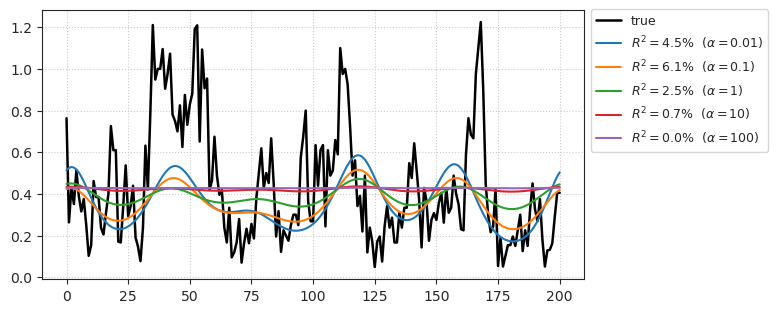

Neuron # 14. lag = 1, r2:
{0.01: 6.644931958860035, 0.1: 5.6088839088153986, 1: 2.2020299262929366, 10: 
0.6932047474978664, 100: 0.0300075952006984}

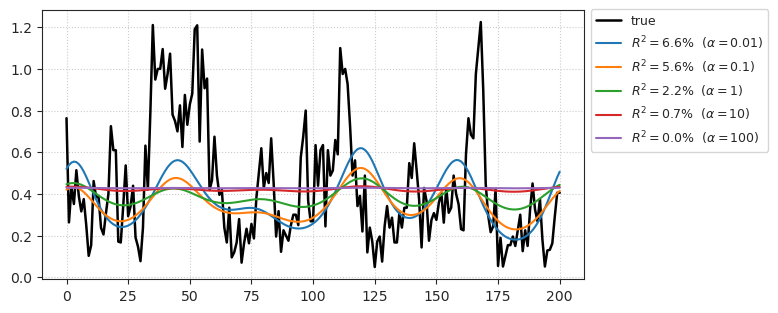

Neuron # 14. lag = 2, r2:
{0.01: 6.857247985827142, 0.1: 4.620253693612453, 1: 1.7178110341290909, 10: 
0.6385586351574268, 100: 0.024871803900883283}

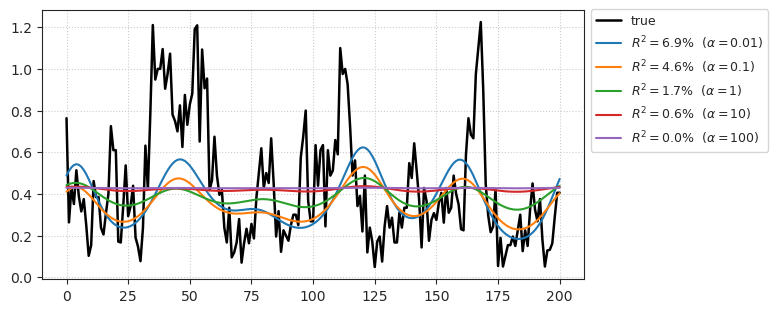

Neuron # 14. lag = 3, r2:
{0.01: 9.054583470607092, 0.1: 4.213969481344826, 1: 1.1802151487303347, 10: 
0.5575188538127107, 100: 0.016514065944484013}

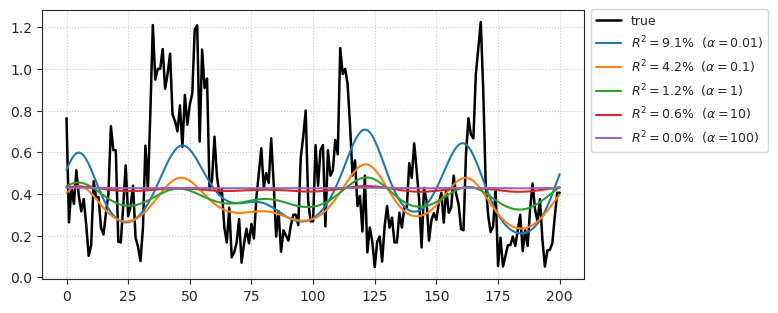

Neuron # 14. lag = 4, r2:
{0.01: 3.8204611602498217, 0.1: 2.6866445933602545, 1: 0.4442004898638774, 10: 
0.44171525515317445, 100: 0.004261896443358282}

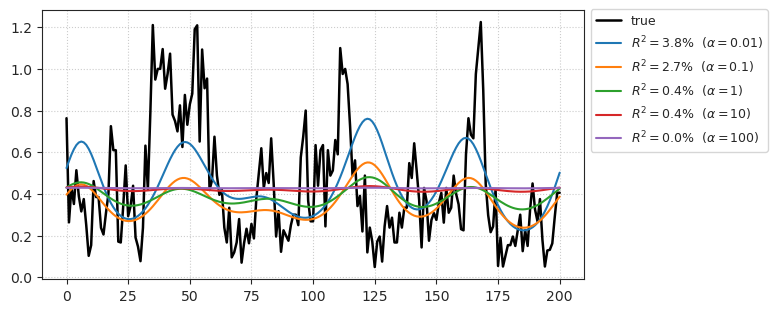

Neuron # 14. lag = 5, r2:
{0.01: -1.916525010187753, 0.1: 0.5694211679753036, 1: -0.45304916530237715, 10: 
0.29019675970599623, 100: -0.012127979177045667}

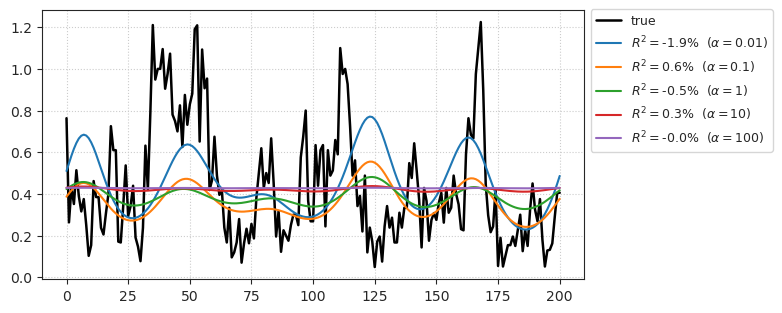

Neuron # 14. lag = 6, r2:
{0.01: -7.6244296988356774, 0.1: -1.999065668307809, 1: -1.365897500239055, 10: 
0.13086190017891353, 100: -0.029580096851855586}

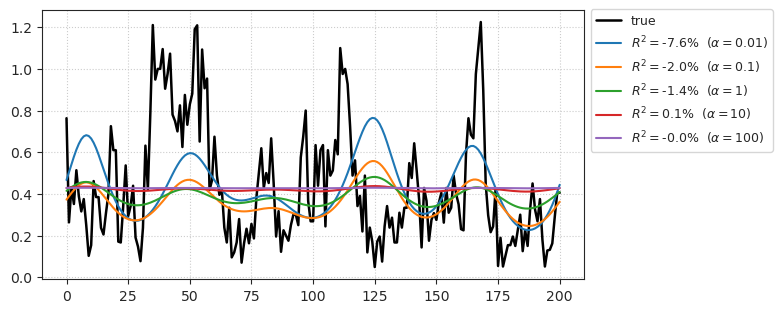

Neuron # 14. lag = 7, r2:
{0.01: -11.674187516785084, 0.1: -4.349962171735777, 1: -2.3054687733222945, 10: 
-0.042405260067956974, 100: -0.048771128862545865}

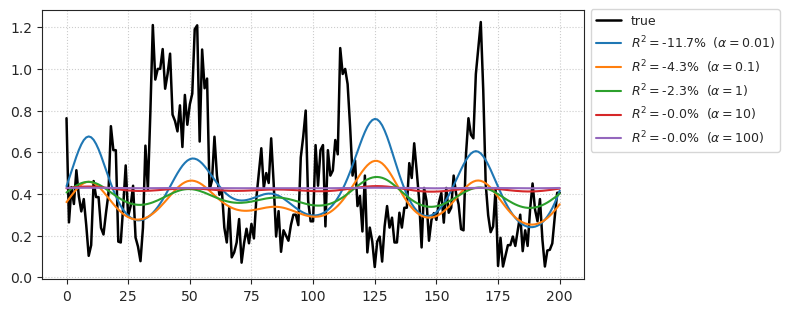

Neuron # 14. lag = 8, r2:
{0.01: -18.33846546411795, 0.1: -6.704130152979393, 1: -3.2309777125013595, 10: 
-0.22110747685464283, 100: -0.06878418482478832}

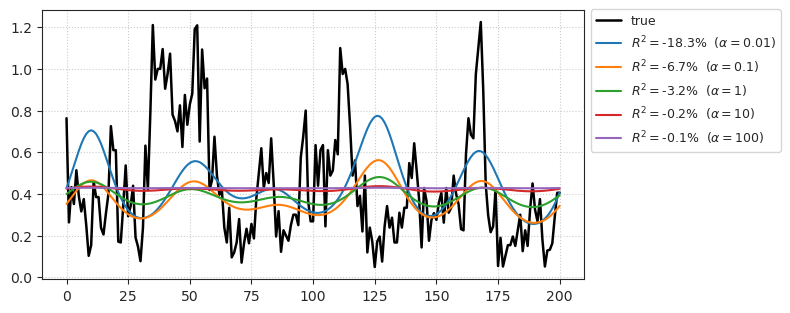

Neuron # 14. lag = 9, r2:
{0.01: -20.861013125398074, 0.1: -8.537419155388616, 1: -4.015879350332585, 10: 
-0.38538466649002956, 100: -0.08746822096359352}

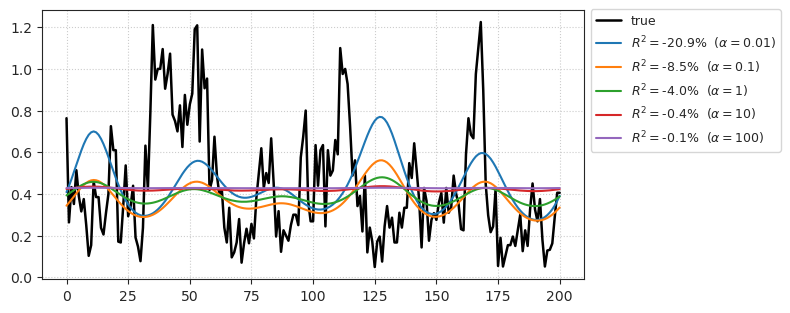

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

CPU times: user 1h 44min 30s, sys: 4min 30s, total: 1h 49min 1s
Wall time: 9min 10s


In [70]:
%%time

for neuron_i in useful:
    for lag in range(10):
        idxs = good.copy()
        idxs = idxs[idxs > lag]

        glm_kws = dict(
            category='PoissonRegressor',
            x=x[idxs - lag],
            y=spks[idxs, neuron_i],
            x_tst=x_r[intvl - lag],
            y_tst=np.nanmean(spks_r[neuron_i], 0),
            alphas=[1e-2, 1e-1, 1, 10, 100],
        )
        glm = LinearModel(**glm_kws).fit(fit_df=False)
        print(f"Neuron # {neuron_i}. lag = {lag}, r2:\n{glm.r2_tst}")
        glm.show_pred();
    print('~' * 80)
    print('\n\n\n')

In [71]:
lags = 10
src = time_embed(x, lags=lags, idxs=good)
src_r = time_embed(x_r, lags=lags, idxs=intvl)
src.shape, src_r.shape

((36591, 10, 500), (201, 10, 500))

In [123]:
neuron_i = 5

glm_kws = dict(
    category='PoissonRegressor',
    x=src,
    y=spks[good, neuron_i],
    x_tst=src_r,
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[0.8, 1, 1.5, 10],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
print(glm.r2_tst)

{
    0.8: 49.98253971862001,
    1: 49.48968636326325,
    1.5: 47.149068866979235,
    10: 28.345905391399462
}

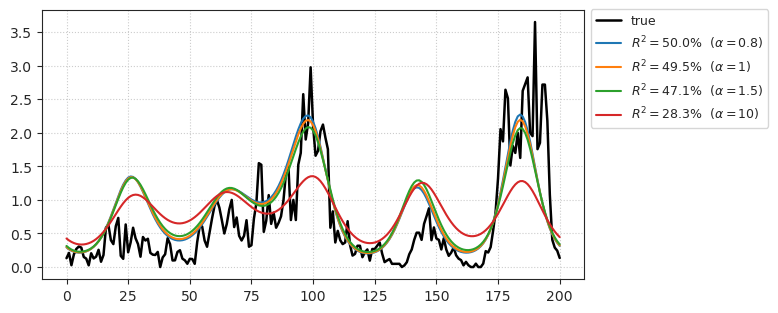

In [124]:
glm.show_pred();

In [125]:
%%time

lag = 6
idxs = good.copy()
idxs = idxs[idxs > lag]

neuron_i = 5
alphas = [5e-3, 1e-2, 5e-2, 1e-1]
results = {
    a: np.zeros((4, 4))
    for a in alphas
}
for i, j in itertools.product(range(4), range(4)):
    glm_kws = dict(
        category='PoissonRegressor',
        x=enc[idxs - lag, ..., i, j],
        y=spks[idxs, neuron_i],
        x_tst=enc_r[intvl - lag, ..., i, j],
        y_tst=np.nanmean(spks_r[neuron_i], 0),
        alphas=alphas,
    )
    glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
    for k, v in glm.r2_tst.items():
        results[k][i, j] = v if v > 0 else np.nan
    print(i, j, glm.r2_tst)

0 0
{
    0.005: -296.825406527139,
    0.01: -36.81541099266323,
    0.05: 6.185901576651842,
    0.1: 2.2555279351993196
}

0 1
{
    0.005: -225.8419451613009,
    0.01: -78.1711580578063,
    0.05: 10.854565499098145,
    0.1: 7.199686685724094
}

0 2
{
    0.005: -805.421420894257,
    0.01: -260.84427711282945,
    0.05: -2.786946215299224,
    0.1: 3.3004195896572996
}

0 3
{
    0.005: -22.745016214795257,
    0.01: -64.13821953295862,
    0.05: -0.985908280052028,
    0.1: -0.56813803059379
}

1 0
{
    0.005: 30.6424345171163,
    0.01: 31.38278148605287,
    0.05: 18.9154906856268,
    0.1: 11.84710513024222
}

1 1
{
    0.005: 13.492607926345656,
    0.01: 13.984036822856394,
    0.05: 34.46699724124367,
    0.1: 24.970273108897366
}

1 2
{
    0.005: 65.98735366952049,
    0.01: 58.66058714739366,
    0.05: 30.56978528949983,
    0.1: 11.49532162325504
}

1 3
{
    0.005: -2991.572463844293,
    0.01: -763.5752012452142,
    0.05: -37.04200412212233,
    0.1: -12.23066363349865
}

2 0
{
    0.005: 0.9461596687374785,
    0.01: 19.56006470837457,
    0.05: 35.20182741301235,
    0.1: 24.664562099228824
}

2 1
{
    0.005: 48.99757524186751,
    0.01: 47.31923852652776,
    0.05: 50.23719328003905,
    0.1: 47.85477703736372
}

2 2
{
    0.005: 56.09714320542673,
    0.01: 50.55231392204733,
    0.05: 38.07039582219759,
    0.1: 29.6862159776607
}

2 3
{
    0.005: -33.40179612205028,
    0.01: -26.23296336846297,
    0.05: -12.819802790857239,
    0.1: -12.36506341086927
}

3 0
{
    0.005: 60.876636461585335,
    0.01: 54.3561656169271,
    0.05: 16.890935707819487,
    0.1: 9.725134437800264
}

3 1
{
    0.005: -17239.83596240022,
    0.01: -5309.601172500764,
    0.05: -57.53594790798382,
    0.1: 33.342890483668754
}

3 2
{
    0.005: -34.61657861340812,
    0.01: -8.841900443527727,
    0.05: 14.340383370835387,
    0.1: 14.43209573623314
}

3 3
{
    0.005: -36.23085774438386,
    0.01: -37.40688865800508,
    0.05: -14.502329734349262,
    0.1: -8.439297296868142
}

CPU times: user 2h 11min 15s, sys: 15min 59s, total: 2h 27min 15s
Wall time: 31min 2s


In [126]:
best = np.zeros((len(results), 4, 4))
for i, v in enumerate(results.values()):
    best[i] = v
best = np.nanmax(best, 0);

/tmp/ipykernel_2969908/2870421635.py:4: RuntimeWarning: All-NaN slice encountered
  best = np.nanmax(best, 0);


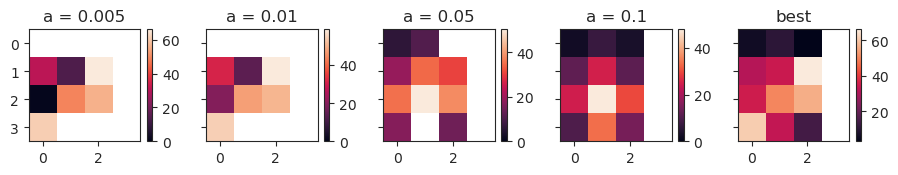

In [127]:
fig, axes = create_figure(1, 5, (9, 1.6), 'all', 'all', constrained_layout=True)
for ax, (k, v) in zip(axes.flat, results.items()):
    im = ax.imshow(v, vmin=0)
    plt.colorbar(im, ax=ax)
    ax.set_title(f"a = {k}")
im = axes[-1].imshow(best)
plt.colorbar(im, ax=axes[-1])
axes[-1].set_title('best')
plt.show()

In [140]:
%%time

i, j = 1, 2
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[4e-3, 5e-3, 6e-3],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=509)
print(i, j, glm.r2_tst)

1 2
{0.004: 21.323840716014065, 0.005: 65.98735366952049, 0.006: 58.78159519628389}

CPU times: user 14min 28s, sys: 1min 52s, total: 16min 20s
Wall time: 3min 30s


In [141]:
glm.r2_tst

{0.004: 21.323840716014065, 0.005: 65.98735366952049, 0.006: 58.78159519628389}

In [142]:
glm.r_tst

{0.004: 0.850862575143545,
 0.005: 0.8515834605261383,
 0.006: 0.8484946983014074}

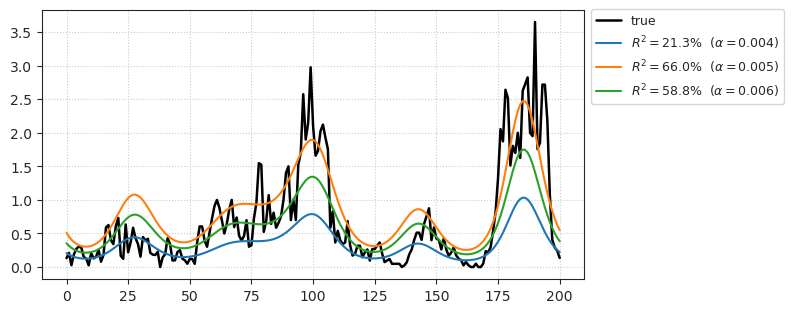

In [143]:
glm.show_pred();

In [144]:
%%time

i, j = 3, 0
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[2e-3, 5e-3, 8e-3, 1e-2],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=509)
print(i, j, glm.r2_tst)

3 0
{
    0.002: 54.726434725588355,
    0.005: 60.876636461585335,
    0.008: 57.49639710620258,
    0.01: 54.3561656169271
}

CPU times: user 5min 17s, sys: 39.8 s, total: 5min 56s
Wall time: 1min 16s


In [145]:
glm.r2_tst

{0.002: 54.726434725588355,
 0.005: 60.876636461585335,
 0.008: 57.49639710620258,
 0.01: 54.3561656169271}

In [146]:
glm.r_tst

{0.002: 0.816730300833981,
 0.005: 0.823988498802013,
 0.008: 0.8192084257801312,
 0.01: 0.8150759454886867}

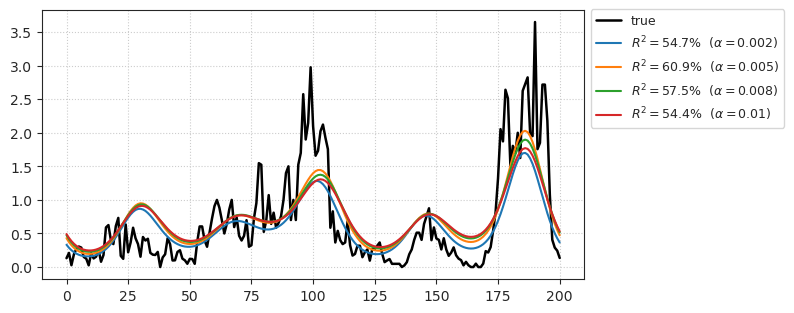

In [147]:
glm.show_pred();

### Neuron # 7

In [109]:
neuron_i = 7

glm_kws = dict(
    category='PoissonRegressor',
    x=src,
    y=spks[good, neuron_i],
    x_tst=src_r,
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[8e-3, 1e-2, 3e-2, 1],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
print(glm.r2_tst)

{
    0.008: 48.45670079790126,
    0.01: 52.49199007159222,
    0.03: 62.11001380280206,
    1: 45.4684477257725
}

In [110]:
%%time

lag = 4
idxs = good.copy()
idxs = idxs[idxs > lag]

neuron_i = 7
alphas = [5e-4, 1e-3, 5e-3, 1e-2, 5e-2]
results = {
    a: np.zeros((4, 4))
    for a in alphas
}
for i, j in itertools.product(range(4), range(4)):
    glm_kws = dict(
        category='PoissonRegressor',
        x=enc[idxs - lag, ..., i, j],
        y=spks[idxs, neuron_i],
        x_tst=enc_r[intvl - lag, ..., i, j],
        y_tst=np.nanmean(spks_r[neuron_i], 0),
        alphas=alphas,
    )
    glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
    for k, v in glm.r2_tst.items():
        results[k][i, j] = v if v > 0 else np.nan
    print(i, j, glm.r2_tst)

0 0
{
    0.0005: -81.57196662111173,
    0.001: -48.29200018758553,
    0.005: -14.314233707853097,
    0.01: -10.160843164412414,
    0.05: -8.212734455238113
}

0 1
{
    0.0005: 45.74182273329907,
    0.001: 46.75944157397522,
    0.005: 19.90494686805101,
    0.01: 11.104215215672175,
    0.05: -1.0876824722854561
}

0 2
{
    0.0005: 35.047083591610416,
    0.001: 38.282142294950816,
    0.005: 27.495504415813944,
    0.01: 13.498379934582438,
    0.05: -1.863022918579449
}

0 3
{
    0.0005: 1.8407488712473774,
    0.001: 9.593614709899434,
    0.005: -1.7489187516394278,
    0.01: -6.466367143576646,
    0.05: -7.603167379733433
}

1 0
{
    0.0005: 41.88583067400881,
    0.001: 40.75103022960318,
    0.005: 10.613126110902982,
    0.01: -0.9409148585645122,
    0.05: -9.320388889608466
}

1 1
{
    0.0005: 15.99835616157449,
    0.001: 19.061993765114625,
    0.005: 27.75081917137936,
    0.01: 19.90040799989362,
    0.05: 9.788075535126062
}

1 2
{
    0.0005: 11.900646778568824,
    0.001: 13.476067248491608,
    0.005: 10.30231499828329,
    0.01: 8.605338458850753,
    0.05: 7.978873724196633
}

1 3
{
    0.0005: 47.88014144426296,
    0.001: 38.26168190326541,
    0.005: 21.03174526757141,
    0.01: 11.2988167771788,
    0.05: 3.797152636760903
}

2 0
{
    0.0005: 6.882583628882255,
    0.001: -5.016332150006986,
    0.005: -15.510295626454763,
    0.01: -16.517975380028748,
    0.05: -12.9828713392121
}

2 1
{
    0.0005: 35.9783266547432,
    0.001: 24.40487033428497,
    0.005: 11.488103061302946,
    0.01: 7.476493032361919,
    0.05: -6.749978691409986
}

2 2
{
    0.0005: 45.76295201703682,
    0.001: 34.51406232082546,
    0.005: 22.13361228144466,
    0.01: 18.81750082730308,
    0.05: 13.729920913687598
}

2 3
{
    0.0005: -43.45682346126311,
    0.001: -14.47879344962022,
    0.005: 9.849487571924865,
    0.01: 22.671199791902307,
    0.05: 27.74019115639499
}

3 0
{
    0.0005: -1.5462574301634557,
    0.001: -3.071094079074377,
    0.005: -6.388900994714897,
    0.01: -6.375068936562522,
    0.05: -6.8190335217427345
}

3 1
{
    0.0005: -167.32719381937565,
    0.001: -2.881777392639151,
    0.005: 26.42271776066909,
    0.01: 22.307972190543857,
    0.05: 13.168130432934145
}

3 2
{
    0.0005: 36.22730370224706,
    0.001: 56.7462218783237,
    0.005: 60.17709172812484,
    0.01: 55.794374408412196,
    0.05: 41.56021057887299
}

3 3
{
    0.0005: 21.60071729953549,
    0.001: 28.241977445089063,
    0.005: 43.58235965155035,
    0.01: 39.97587126456115,
    0.05: 21.720515535778862
}

CPU times: user 2h 3min 59s, sys: 15min 12s, total: 2h 19min 11s
Wall time: 29min 33s


In [111]:
best = np.zeros((len(results), 4, 4))
for i, v in enumerate(results.values()):
    best[i] = v
best = np.nanmax(best, 0);

/tmp/ipykernel_2969908/2870421635.py:4: RuntimeWarning: All-NaN slice encountered
  best = np.nanmax(best, 0);


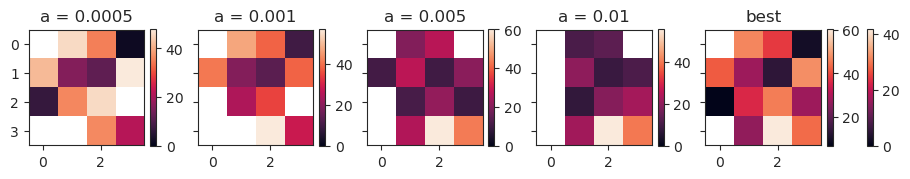

In [112]:
fig, axes = create_figure(1, 5, (9, 1.6), 'all', 'all', constrained_layout=True)
for ax, (k, v) in zip(axes.flat, results.items()):
    im = ax.imshow(v, vmin=0)
    plt.colorbar(im, ax=ax)
    ax.set_title(f"a = {k}")
im = axes[-1].imshow(best)
plt.colorbar(im, ax=axes[-1])
axes[-1].set_title('best')
plt.show()

In [113]:
%%time

i, j = 3, 2
glm_kws = dict(
    category='PoissonRegressor',
    x=enc[idxs - lag, ..., i, j],
    y=spks[idxs, neuron_i],
    x_tst=enc_r[intvl - lag, ..., i, j],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[1e-3, 3e-3, 5e-3, 8e-3, 0.01],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=500)
print(i, j, glm.r2_tst)

3 2
{
    0.001: 56.7462218783237,
    0.003: 62.370853358571296,
    0.005: 60.17709172812484,
    0.008: 57.57309847231193,
    0.01: 55.794374408412196
}

CPU times: user 7min 18s, sys: 52.4 s, total: 8min 10s
Wall time: 1min 42s


In [114]:
glm.r2_tst

{0.001: 56.7462218783237,
 0.003: 62.370853358571296,
 0.005: 60.17709172812484,
 0.008: 57.57309847231193,
 0.01: 55.794374408412196}

In [115]:
glm.r_tst

{0.001: 0.8004467572385365,
 0.003: 0.7947794830616541,
 0.005: 0.7852522566915222,
 0.008: 0.7710579565156384,
 0.01: 0.7628137355096081}

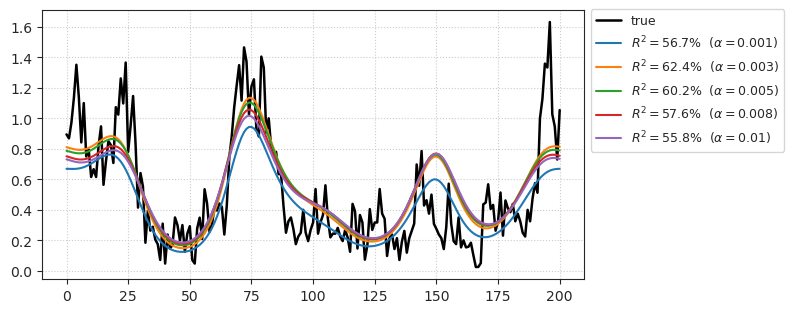

In [116]:
glm.show_pred();